In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from geopy.geocoders import Nominatim

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving Base_2019.xlsx to Base_2019 (2).xlsx


In [ ]:
8
# Nombre del archivo CSV con múltiples hojas
archivo_csv = "Base_2019.xlsx"

# Leer cada hoja del archivo CSV en un diccionario de DataFrames
diccionario_dataframes = pd.read_excel(archivo_csv, sheet_name=None)

# Iterar a través de las hojas y procesar cada DataFrame
for nombre_hoja, dataframe in diccionario_dataframes.items():
    # Imprimir el nombre de la hoja
    print("Hoja:", nombre_hoja)
    # Imprimir el contenido del DataFrame
    print(dataframe)
    print("-------------------------------------")

Hoja: ACCIDENTES
       idFormulario      Dia      Fecha MES_PROCESADO   Oficina  GravedadCod  \
0                 1    LUNES 2019-01-21         ENERO  11001000            2   
1                 2   MARTES 2019-01-08         ENERO  11001000            3   
2                 3   MARTES 2019-01-01         ENERO  11001000            2   
3                 4   MARTES 2019-01-01         ENERO  11001000            3   
4                 5  VIERNES 2019-01-18         ENERO  11001000            3   
...             ...      ...        ...           ...       ...          ...   
34985         34986    LUNES 2019-12-30     DICIEMBRE  11001000            3   
34986         34987    LUNES 2019-12-30     DICIEMBRE  11001000            3   
34987         34988   MARTES 2019-12-31     DICIEMBRE  11001000            3   
34988         34989   MARTES 2019-12-31     DICIEMBRE  11001000            3   
34989         34990   MARTES 2019-12-31     DICIEMBRE  11001000            2   

      GravedadNombre  

In [ ]:
# Iterar a través de las hojas y procesar cada DataFrame
for nombre_hoja, dataframe in diccionario_dataframes.items():
    # Imprimir el nombre de la hoja
    print("Hoja:", nombre_hoja)

    # Contar columnas numéricas, categóricas y ordinales
    contador_numericas = len(dataframe.select_dtypes(include=['number']).columns)
    contador_categoricas = len(dataframe.select_dtypes(include=['object']).columns)
    contador_ordinales = len(dataframe.select_dtypes(include=['category']).columns)

    # Imprimir los resultados
    print(f"Columnas numéricas: {contador_numericas}")
    print(f"Columnas categóricas: {contador_categoricas}")
    #print(f"Columnas ordinales: {contador_ordinales}")
    print("-------------------------------------")

Hoja: ACCIDENTES
Columnas numéricas: 15
Columnas categóricas: 33
-------------------------------------
Hoja: CONDUCTORES
Columnas numéricas: 5
Columnas categóricas: 36
-------------------------------------
Hoja: VICTIMAS
Columnas numéricas: 7
Columnas categóricas: 23
-------------------------------------


In [ ]:
# Crear un diccionario para almacenar la cuenta de columnas por tipo de datos
contador_tipos = {}

# Crear un diccionario para almacenar los nombres de las columnas por tipo de datos
nombres_columnas = {}

# Iterar a través de las hojas y procesar cada DataFrame
for nombre_hoja, dataframe in diccionario_dataframes.items():
    # Obtener el nombre de la hoja como clave en el diccionario
    contador_tipos[nombre_hoja] = {
        'Columnas numéricas': len(dataframe.select_dtypes(include=['number']).columns),
        'Columnas categóricas': len(dataframe.select_dtypes(include=['object', 'category']).columns)
    }

    # Obtener los nombres de las columnas numéricas y categóricas
    nombres_columnas[nombre_hoja] = {
        'Columnas numéricas': dataframe.select_dtypes(include=['number']).columns.tolist(),
        'Columnas categóricas': dataframe.select_dtypes(include=['object', 'category']).columns.tolist()
    }

# Crear un DataFrame a partir del diccionario de conteo
tabla_contador = pd.DataFrame(contador_tipos).T

# Crear un DataFrame para los nombres de las columnas
tabla_nombres = pd.DataFrame(nombres_columnas).T

# Combinar los DataFrames de conteo y nombres
tabla_final = pd.concat([tabla_contador, tabla_nombres], axis=1)

# Mostrar el DataFrame final
print(tabla_final)

            Columnas numéricas Columnas categóricas  \
ACCIDENTES                  15                   33   
CONDUCTORES                  5                   36   
VICTIMAS                     7                   23   

                                            Columnas numéricas  \
ACCIDENTES   [idFormulario, Oficina, GravedadCod, ClaseCodi...   
CONDUCTORES  [idFormulario, Vehiculo, ModeloVehiculo, Capac...   
VICTIMAS     [idFormulario, Numero, CodigoVehiculo, GradoOf...   

                                          Columnas categóricas  
ACCIDENTES   [Dia, MES_PROCESADO, GravedadNombre, ClaseNomb...  
CONDUCTORES  [MES_PROCESADO, DIA_PROCESADO, EDAD_PROCESADA,...  
VICTIMAS     [MES_PROCESADO, DIA_PROCESADO, EDAD_PROCESADA,...  


In [ ]:
# Leer cada hoja del archivo Excel en un diccionario de DataFrames

# Obtener las listas de columnas numéricas y categóricas de la primera hoja
columnas_numericas_comunes = set(diccionario_dataframes[list(diccionario_dataframes.keys())[0]].select_dtypes(include=['number']).columns)
columnas_categoricas_comunes = set(diccionario_dataframes[list(diccionario_dataframes.keys())[0]].select_dtypes(include=['object', 'category']).columns)

# Iterar a través de las hojas restantes y encontrar las columnas comunes
for nombre_hoja, dataframe in diccionario_dataframes.items():
    columnas_numericas_comunes &= set(dataframe.select_dtypes(include=['number']).columns)
    columnas_categoricas_comunes &= set(dataframe.select_dtypes(include=['object', 'category']).columns)

# Crear una serie con las columnas comunes
columnas_comunes = pd.Series({'Columnas Numéricas Comunes': sorted(list(columnas_numericas_comunes)),
                              'Columnas Categóricas Comunes': sorted(list(columnas_categoricas_comunes))})

# Mostrar la serie
print(columnas_comunes)

Columnas Numéricas Comunes                                         [idFormulario]
Columnas Categóricas Comunes    [CON_BICICLETA, CON_CARGA, CON_EMBRIAGUEZ, CON...
dtype: object


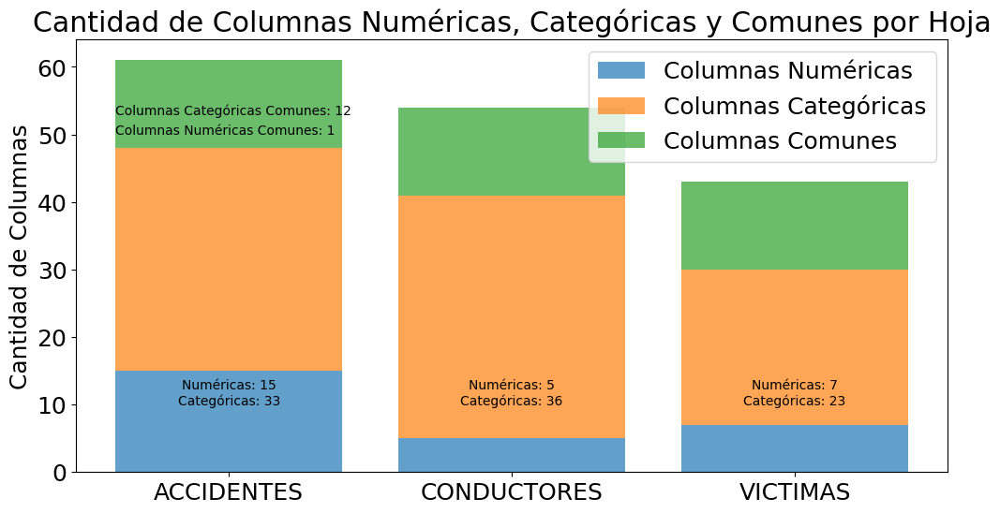

In [ ]:
# Obtener las listas de columnas numéricas y categóricas de la primera hoja
columnas_numericas_comunes = set(diccionario_dataframes[list(diccionario_dataframes.keys())[0]].select_dtypes(include=['number']).columns)
columnas_categoricas_comunes = set(diccionario_dataframes[list(diccionario_dataframes.keys())[0]].select_dtypes(include=['object', 'category']).columns)

# Iterar a través de las hojas restantes y encontrar las columnas comunes
for nombre_hoja, dataframe in diccionario_dataframes.items():
    columnas_numericas_comunes &= set(dataframe.select_dtypes(include=['number']).columns)
    columnas_categoricas_comunes &= set(dataframe.select_dtypes(include=['object', 'category']).columns)

# Crear una serie con las columnas comunes
columnas_comunes = pd.Series({'Columnas Numéricas Comunes': len(columnas_numericas_comunes),
                              'Columnas Categóricas Comunes': len(columnas_categoricas_comunes)})

# Crear una lista con las cantidades de columnas numéricas y categóricas por hoja
cantidad_numericas = []
cantidad_categoricas = []
nombres_hojas = []

# Iterar a través de las hojas y procesar cada DataFrame
for nombre_hoja, dataframe in diccionario_dataframes.items():
    # Obtener la cantidad de columnas numéricas y categóricas
    num_numericas = len(dataframe.select_dtypes(include=['number']).columns)
    num_categoricas = len(dataframe.select_dtypes(include=['object', 'category']).columns)

    # Agregar los datos a las listas
    cantidad_numericas.append(num_numericas)
    cantidad_categoricas.append(num_categoricas)
    nombres_hojas.append(nombre_hoja)

# Crear un DataFrame con los datos
data = {
    'Hojas': nombres_hojas,
    'Columnas Numéricas': cantidad_numericas,
    'Columnas Categóricas': cantidad_categoricas
}

df = pd.DataFrame(data)

# Agregar la cantidad de columnas comunes al DataFrame
df['Columnas Comunes'] = [len(columnas_numericas_comunes) + len(columnas_categoricas_comunes)] * len(df)

# Crear el gráfico de barras
plt.figure(figsize=(12, 6))
plt.bar(df['Hojas'], df['Columnas Numéricas'], label='Columnas Numéricas', alpha=0.7)
plt.bar(df['Hojas'], df['Columnas Categóricas'], bottom=df['Columnas Numéricas'], label='Columnas Categóricas', alpha=0.7)
plt.bar(df['Hojas'], df['Columnas Comunes'], bottom=df['Columnas Numéricas'] + df['Columnas Categóricas'], label='Columnas Comunes', alpha=0.7)
#plt.xlabel('Comunes')
plt.ylabel('Cantidad de Columnas')
plt.title('Cantidad de Columnas Numéricas, Categóricas y Comunes por Hoja')
plt.legend()

# Agregar la serie de columnas comunes al gráfico
for i, (index, value) in enumerate(columnas_comunes.items()):
    plt.text(-0.4, 50 + i * 3, f"{index}: {value}", fontsize=10)

# Agregar etiquetas de cuentas de columnas numéricas y categóricas por hoja en la parte inferior
for i, row in df.iterrows():
    plt.text(i, 10, f"Numéricas: {row['Columnas Numéricas']}\nCategóricas: {row['Columnas Categóricas']}",
             ha='center', fontsize=10)

plt.xticks()
plt.show()

In [ ]:

# Crear un diccionario para almacenar las estadísticas seleccionadas de todas las hojas numéricas
estadisticas_seleccionadas = {}

# Iterar a través de las hojas y procesar cada DataFrame
for nombre_hoja, dataframe in diccionario_dataframes.items():
    # Filtrar solo las columnas numéricas
    columnas_numericas = dataframe.select_dtypes(include=['number'])

    # Calcular las estadísticas deseadas (media, desviación estándar y conteo)
    estadisticas = columnas_numericas.agg(['mean', 'std', 'count']).transpose()

    # Renombrar las columnas para indicar las estadísticas
    estadisticas.columns = [f'{nombre_hoja}_media', f'{nombre_hoja}_std', f'{nombre_hoja}_count']

    # Almacenar las estadísticas en el diccionario
    estadisticas_seleccionadas[nombre_hoja] = estadisticas

In [ ]:
estadisticas_seleccionadas

{'ACCIDENTES':                   ACCIDENTES_media  ACCIDENTES_std  ACCIDENTES_count
 idFormulario          1.749550e+04    10100.887296           34990.0
 Oficina               1.100100e+07        0.000000           34990.0
 GravedadCod           2.618320e+00        0.513936           34990.0
 ClaseCodigo           1.240040e+00        0.690634           34990.0
 ChoqueCodigo          1.128738e+00        0.610917           29727.0
 ObjetoFijoCodigo      4.990909e+00        3.570268            1210.0
 OtraClase             3.829787e+00        0.390757             188.0
 Latitud               0.000000e+00        0.000000           34990.0
 Longitud              0.000000e+00        0.000000           34990.0
 NumeroVia2            5.854426e+01       42.756743           34781.0
 Complemento           7.458988e+00       16.687660           34990.0
 HORA_PROCESADA        1.293370e+01        5.427881           34990.0
 Sector                1.000086e+00        0.009259           34990.0
 Zona 

<ipython-input-218-d42b6fd59b81>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_porcentajes = df_porcentajes.append({'Hoja': nombre_hoja, 'Completitud': porcentaje_completitud.mean(), 'Faltantes': porcentaje_faltantes}, ignore_index=True)
<ipython-input-218-d42b6fd59b81>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_porcentajes = df_porcentajes.append({'Hoja': nombre_hoja, 'Completitud': porcentaje_completitud.mean(), 'Faltantes': porcentaje_faltantes}, ignore_index=True)
<ipython-input-218-d42b6fd59b81>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_porcentajes = df_porcentajes.append({'Hoja': nombre_hoja, 'Completitud': porcentaje_completitud.mean(), 'Faltantes': porcentaje_faltantes}, ignore_index=True

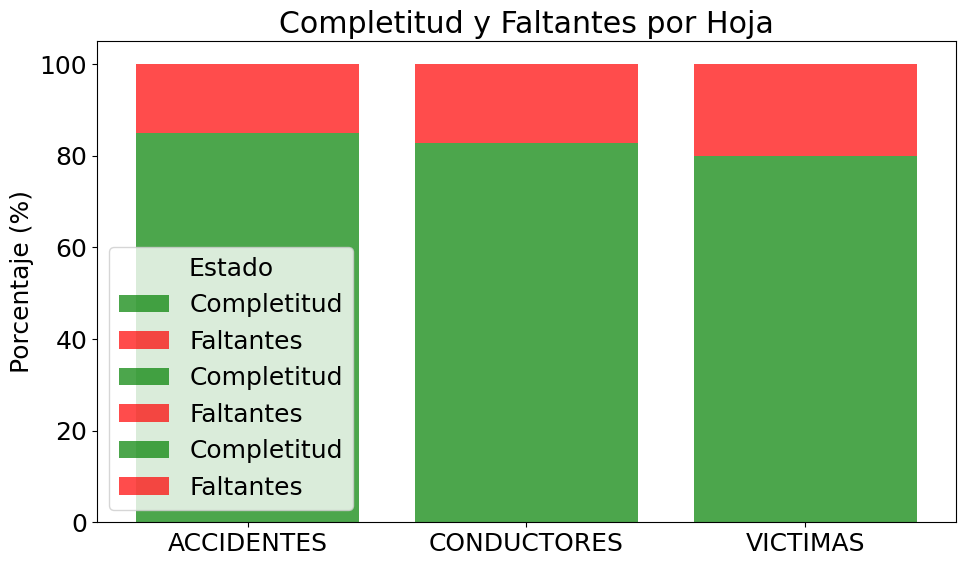

In [ ]:
import pandas as pd
# Crear un DataFrame para almacenar los porcentajes de completitud y faltantes por hoja
df_porcentajes = pd.DataFrame(columns=['Hoja', 'Completitud', 'Faltantes'])

# Iterar a través de las hojas y calcular los porcentajes
for nombre_hoja, dataframe in diccionario_dataframes.items():
    # Calcular el número de valores no nulos por columna
    valores_no_nulos = dataframe.notnull().sum()

    # Calcular el porcentaje de completitud por columna
    porcentaje_completitud = (valores_no_nulos / len(dataframe)) * 100

    # Calcular el porcentaje de faltantes
    porcentaje_faltantes = 100 - porcentaje_completitud.mean()

    # Agregar los valores al DataFrame
    df_porcentajes = df_porcentajes.append({'Hoja': nombre_hoja, 'Completitud': porcentaje_completitud.mean(), 'Faltantes': porcentaje_faltantes}, ignore_index=True)

# Crear un gráfico de barras apiladas para los porcentajes acumulados
fig, ax = plt.subplots(figsize=(10, 6))

for nombre_hoja, porcentajes in df_porcentajes.iterrows():
    ax.bar(nombre_hoja, porcentajes['Completitud'], label='Completitud', color='green', alpha=0.7)
    ax.bar(nombre_hoja, porcentajes['Faltantes'], bottom=porcentajes['Completitud'], label='Faltantes', color='red', alpha=0.7)

ax.set_ylabel('Porcentaje (%)')
ax.set_title('Completitud y Faltantes por Hoja')
ax.legend(title='Estado')

plt.xticks(range(len(df_porcentajes)), df_porcentajes['Hoja'])
plt.tight_layout()
plt.show()

In [ ]:
diccionario_dataframes.keys()

dict_keys(['ACCIDENTES', 'CONDUCTORES', 'VICTIMAS'])

In [ ]:
# Crear un diccionario para almacenar los resultados por hoja
resultados_por_hoja = {}

# Iterar a través de las hojas y procesar cada DataFrame
for nombre_hoja, dataframe in diccionario_dataframes.items():
    # Identificar columnas categóricas en el DataFrame actual
    columnas_categoricas = dataframe.select_dtypes(include=['object']).columns

    # Crear una lista para almacenar los resultados de esta hoja
    resultados = []

    # Realizar análisis para cada columna categórica
    for columna in columnas_categoricas:
        valores_unicos = dataframe[columna].nunique()
        primeros_valores = list(dataframe[columna].unique()[:2])

        # Calcular el largo promedio de las cadenas en la columna
        largo_promedio = dataframe[columna].str.len().mean()

        resultados.append({'Columna': columna,
                           'Valores Únicos': valores_unicos,
                           'Primeros 2 Valores': primeros_valores,
                           'Largo Promedio': round(largo_promedio, 2)})

    # Agregar los resultados al diccionario de resultados por hoja
    resultados_por_hoja[nombre_hoja] = pd.DataFrame(resultados)

# Mostrar los DataFrames de resultados por hoja
for nombre_hoja, resultados_data in resultados_por_hoja.items():
    print("Hoja:", nombre_hoja)
    print(resultados_data)
    print("-------------------------------------")

Hoja: ACCIDENTES
              Columna  Valores Únicos             Primeros 2 Valores  \
0                 Dia               7                [LUNES, MARTES]   
1       MES_PROCESADO              12               [ENERO, FEBRERO]   
2      GravedadNombre               3      [Con Heridos, Solo Daños]   
3         ClaseNombre               6            [Atropello, Choque]   
4        ChoqueNombre               5                [nan, Vehiculo]   
5    ObjetoFijoNombre              15                   [nan, Poste]   
6     NombreOtraClase               3         [nan, Aprisionamiento]   
7           Direccion           23596  [AK 10-CL 11 2, KR 4-CL 29 2]   
8            TipoVia1               7                       [AK, KR]   
9          NumeroVia1             241                        [10, 4]   
10          LetraVia1              22                       [nan, A]   
11       CardinalVia1               2                       [nan, S]   
12           TipoVia2               7          

In [ ]:
ACCIDENTES = diccionario_dataframes["ACCIDENTES"]

In [ ]:
ACCIDENTES

,idFormulario,Dia,Fecha,MES_PROCESADO,Oficina,GravedadCod,GravedadNombre,ClaseCodigo,ClaseNombre,ChoqueCodigo,...,CON_CARGA,CON_EMBRIAGUEZ,CON_HUECOS,CON_MENORES,CON_MOTO,CON_PEATON,CON_PERSONA_MAYOR,CON_RUTAS,CON_TPI,CON_VELOCIDAD
0,1,LUNES,2019-01-21,ENERO,11001000,2,Con Heridos,2,Atropello,NaN,...,NO,NO,NO,NO,NO,SI,SI,NO,NO,NO
1,2,MARTES,2019-01-08,ENERO,11001000,3,Solo Daños,1,Choque,1.0,...,NO,NO,NO,NO,SI,NO,SI,NO,NO,NO
2,3,MARTES,2019-01-01,ENERO,11001000,2,Con Heridos,1,Choque,1.0,...,NO,NO,NO,NO,NO,NO,NO,NO,NO,NO
3,4,MARTES,2019-01-01,ENERO,11001000,3,Solo Daños,1,Choque,1.0,...,NO,NO,NO,NO,SI,NO,NO,NO,NO,NO
4,5,VIERNES,2019-01-18,ENERO,11001000,3,Solo Daños,1,Choque,1.0,...,NO,NO,NO,NO,NO,NO,NO,NO,NO,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34985,34986,LUNES,2019-12-30,DICIEMBRE,11001000,3,Solo Daños,1,Choque,4.0,...,NO,NO,NO,NO,NO,NO,SI,NO,NO,NO
34986,34987,LUNES,2019-12-30,DICIEMBRE,11001000,3,Solo Daños,1,Choque,1.0,...,NO,NO,NO,NO,SI,NO,NO,NO,NO,NO
34987,34988,MARTES,2019-12-31,DICIEMBRE,11001000,3,Solo Daños,1,Choque,1.0,...,NO,NO,NO,NO,NO,NO,NO,NO,NO,NO
34988,34989,MARTES,2019-12-31,DICIEMBRE,11001000,3,Solo Daños,1,Choque,1.0,...,SI,NO,NO,NO,NO,NO,NO,NO,NO,NO


In [ ]:
ACCIDENTES.shape

(34990, 50)

In [ ]:
ACCIDENTES.columns

Index(['idFormulario', 'Dia', 'Fecha', 'MES_PROCESADO', 'Oficina',
       'GravedadCod', 'GravedadNombre', 'ClaseCodigo', 'ClaseNombre',
       'ChoqueCodigo', 'ChoqueNombre', 'ObjetoFijoCodigo', 'ObjetoFijoNombre',
       'OtraClase', 'NombreOtraClase', 'Latitud', 'Longitud', 'Direccion',
       'TipoVia1', 'NumeroVia1', 'LetraVia1', 'CardinalVia1', 'TipoVia2',
       'NumeroVia2', 'LetraVia2', 'CardinalVia2', 'Complemento', 'Municipio',
       'Localidad', 'FechaOcurrencia', 'HoraOcurrencia', 'HORA_PROCESADA',
       'Area', 'Sector', 'Zona', 'TipoDisenno', 'TipoTiempo', 'ZonaTransito',
       'AreaTransito', 'CON_BICICLETA', 'CON_CARGA', 'CON_EMBRIAGUEZ',
       'CON_HUECOS', 'CON_MENORES', 'CON_MOTO', 'CON_PEATON',
       'CON_PERSONA_MAYOR', 'CON_RUTAS', 'CON_TPI', 'CON_VELOCIDAD'],
      dtype='object')

In [ ]:
ACCIDENTES["TipoVia1"].unique()

array(['AK', 'KR', 'CL', 'AV', 'TR', 'AC', 'DG'], dtype=object)

In [ ]:
mapeo_reemplazo = {
    'CL': 'Calle',
    'KR': 'Carrera',
    'AV': '',
    'AK': '',
    'TR': 'Transversal',
    'AC': 'Avenida Calle',
    'DG': 'Diagonal'
}

# Reemplazar los valores en la columna 'Direccion'
ACCIDENTES['TipoVia1'] = ACCIDENTES['TipoVia1'].replace(mapeo_reemplazo, regex=True)
ACCIDENTES['TipoVia2'] = ACCIDENTES['TipoVia1'].replace("#", regex=True)

# Imprimir el DataFrame actualizado
print(ACCIDENTES["TipoVia1"].unique())
print(ACCIDENTES["TipoVia2"].unique())

['' 'Carrera' 'Calle' 'Transversal' 'Avenida Calle' 'Diagonal']
['' 'Carrera' 'Calle' 'Transversal' 'Avenida Calle' 'Diagonal']


In [ ]:
ACCIDENTES.dtypes

idFormulario                  int64
Dia                          object
Fecha                datetime64[ns]
MES_PROCESADO                object
Oficina                       int64
GravedadCod                   int64
GravedadNombre               object
ClaseCodigo                   int64
ClaseNombre                  object
ChoqueCodigo                float64
ChoqueNombre                 object
ObjetoFijoCodigo            float64
ObjetoFijoNombre             object
OtraClase                   float64
NombreOtraClase              object
Latitud                     float64
Longitud                    float64
Direccion                    object
TipoVia1                     object
NumeroVia1                   object
LetraVia1                    object
CardinalVia1                 object
TipoVia2                     object
NumeroVia2                  float64
LetraVia2                    object
CardinalVia2                 object
Complemento                   int64
Municipio                   

In [ ]:
# Crear la nueva columna 'Direccion' concatenando las columnas requeridas
def convertir_a_str(valor):
    if pd.isnull(valor):
        return ""
    else:
        return str(valor)

# Crear la nueva columna 'Direccion' concatenando las columnas requeridas
ACCIDENTES['Direccion'] = (
    ACCIDENTES['TipoVia1'].apply(convertir_a_str) + ' ' +
    ACCIDENTES['NumeroVia1'].apply(convertir_a_str) +
    ACCIDENTES['LetraVia1'].apply(convertir_a_str) + ' # ' +
    #ACCIDENTES['CardinalVia1'].apply(convertir_a_str) + '# ' +
    #ACCIDENTES['TipoVia2'].apply(convertir_a_str) + ' ' +
    ACCIDENTES['NumeroVia2'].apply(convertir_a_str) +
    ACCIDENTES['LetraVia2'].apply(convertir_a_str) + ',' +
    #ACCIDENTES['CardinalVia2'].apply(convertir_a_str) + ' ' +
    #ACCIDENTES['Complemento'].apply(convertir_a_str) + ", "+
    ACCIDENTES['Localidad'].apply(convertir_a_str)
)

# Imprimir el DataFrame actualizado con la nueva columna 'Direccion'
print(ACCIDENTES['Direccion'][31])


Carrera 68 # 12.0,KENNEDY


In [ ]:
# Imprimir el DataFrame actualizado con la nueva columna 'Direccion'
print(ACCIDENTES['Direccion'][31])

Carrera 68 # 12.0,KENNEDY


In [ ]:
# Función para limpiar y formatear la dirección
def limpiar_direccion(direccion):
    direccion_limpia = ' '.join(direccion.split())  # Eliminar espacios duplicados o triples
    direccion_limpia = direccion_limpia.replace('.0', '')  # Eliminar ".0"
    return direccion_limpia

# Aplicar la función de limpieza a la columna 'Direccion'
ACCIDENTES['Direccion'] = ACCIDENTES['Direccion'].apply(limpiar_direccion)

# Imprimir el DataFrame actualizado con las direcciones limpias
print(ACCIDENTES['Direccion'])

0                             10 # 11,SANTA FE
1                      Carrera 4 # 29,SANTA FE
2                          Calle 78 # 80J,BOSA
3               Calle 100 # 67A,BARRIOS UNIDOS
4                    AVENIDA DEL SUR # 59,BOSA
                         ...                  
34985               Calle 3 # 30,PUENTE ARANDA
34986              Calle 17A # 6,SAN CRISTOBAL
34987    AVENIDA CIUDAD DE CALI # 19A,ENGATIVA
34988               Carrera 24 # 49,TUNJUELITO
34989         Diagonal 69F # 48,CIUDAD BOLIVAR
Name: Direccion, Length: 34990, dtype: object


In [ ]:
CONDUCTORES= diccionario_dataframes["CONDUCTORES"]
CONDUCTORES.shape

(66179, 42)

In [ ]:
VICTIMAS= diccionario_dataframes["VICTIMAS"]

In [ ]:
VICTIMAS.dtypes

idFormulario                             int64
Fecha                           datetime64[ns]
MES_PROCESADO                           object
DIA_PROCESADO                           object
Numero                                   int64
EDAD_PROCESADA                          object
LLevaCinturon                           object
LlevaChaleco                            object
LLevaCasco                              object
Peaton_Pasajero                         object
CodigoVehiculo                           int64
Sexo                                    object
GRAVEDAD_PROCESADA                      object
ClaseOficial                            object
GradoOficial                           float64
UnidadOficial                          float64
EstabaEnServicio                       float64
Trasladado_en                          float64
VEHICULO_VIAJABA                        object
VEHICULO_VIAJABA_CLASIFICADO            object
CON_BICICLETA                           object
CON_CARGA    

In [ ]:
VICTIMAS.shape

(9465, 31)

In [ ]:
VICTIMAS.describe().T

,count,mean,std,min,25%,50%,75%,max
idFormulario,9465.0,16790.144849,10033.956878,1.0,8039.0,16596.0,25204.0,34990.0
Numero,9465.0,1.977073,4.414660,1.0,1.0,1.0,1.0,64.0
CodigoVehiculo,9465.0,0.812150,0.813428,0.0,0.0,1.0,1.0,6.0
GradoOficial,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
UnidadOficial,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EstabaEnServicio,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Trasladado_en,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


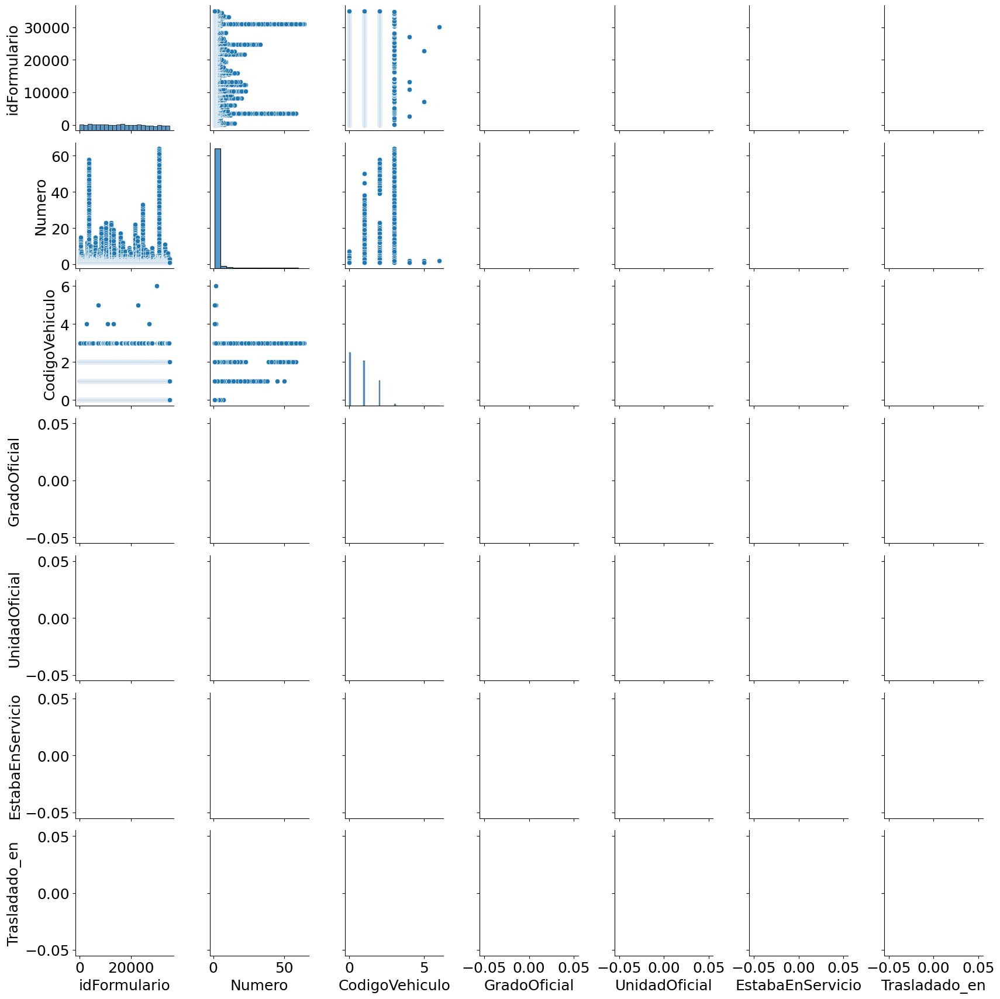

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


# Crear un gráfico de pares
sns.pairplot(VICTIMAS,diag_kind="hist")

# Mostrar el gráfico
plt.show()

In [ ]:
# Calcular el número de valores únicos por columna
valores_unicos_por_columna = VICTIMAS.nunique()

valores_unicos_por_columna

idFormulario                    7423
Fecha                            365
MES_PROCESADO                     12
DIA_PROCESADO                      7
Numero                            64
EDAD_PROCESADA                   102
LLevaCinturon                      2
LlevaChaleco                       2
LLevaCasco                         2
Peaton_Pasajero                    3
CodigoVehiculo                     7
Sexo                               3
GRAVEDAD_PROCESADA                 3
ClaseOficial                       1
GradoOficial                       0
UnidadOficial                      0
EstabaEnServicio                   0
Trasladado_en                      0
VEHICULO_VIAJABA                  13
VEHICULO_VIAJABA_CLASIFICADO       8
CON_BICICLETA                      2
CON_CARGA                          2
CON_EMBRIAGUEZ                     2
CON_HUECOS                         2
CON_MENORES                        2
CON_MOTO                           2
CON_PEATON                         2
C

In [ ]:
VICTIMAS.isnull().sum()

idFormulario                       0
Fecha                              0
MES_PROCESADO                      0
DIA_PROCESADO                      0
Numero                             0
EDAD_PROCESADA                     0
LLevaCinturon                   5857
LlevaChaleco                    7613
LLevaCasco                      7613
Peaton_Pasajero                    0
CodigoVehiculo                     0
Sexo                               0
GRAVEDAD_PROCESADA                 0
ClaseOficial                      61
GradoOficial                    9465
UnidadOficial                   9465
EstabaEnServicio                9465
Trasladado_en                   9465
VEHICULO_VIAJABA                   3
VEHICULO_VIAJABA_CLASIFICADO       0
CON_BICICLETA                      0
CON_CARGA                          0
CON_EMBRIAGUEZ                     0
CON_HUECOS                         0
CON_MENORES                        0
CON_MOTO                           0
CON_PEATON                         0
C

In [ ]:
VICTIMAS2= VICTIMAS.dropna(axis=1, how='all')
VICTIMAS2.shape

(9465, 27)

In [ ]:
VICTIMAS2.dtypes

idFormulario                             int64
Fecha                           datetime64[ns]
MES_PROCESADO                           object
DIA_PROCESADO                           object
Numero                                   int64
EDAD_PROCESADA                          object
LLevaCinturon                           object
LlevaChaleco                            object
LLevaCasco                              object
Peaton_Pasajero                         object
CodigoVehiculo                           int64
Sexo                                    object
GRAVEDAD_PROCESADA                      object
ClaseOficial                            object
VEHICULO_VIAJABA                        object
VEHICULO_VIAJABA_CLASIFICADO            object
CON_BICICLETA                           object
CON_CARGA                               object
CON_EMBRIAGUEZ                          object
CON_HUECOS                              object
CON_MENORES                             object
CON_MOTO     

In [ ]:
VICTIMAS2.nunique()

idFormulario                    7423
Fecha                            365
MES_PROCESADO                     12
DIA_PROCESADO                      7
Numero                            64
EDAD_PROCESADA                   102
LLevaCinturon                      2
LlevaChaleco                       2
LLevaCasco                         2
Peaton_Pasajero                    3
CodigoVehiculo                     7
Sexo                               3
GRAVEDAD_PROCESADA                 3
ClaseOficial                       1
VEHICULO_VIAJABA                  13
VEHICULO_VIAJABA_CLASIFICADO       8
CON_BICICLETA                      2
CON_CARGA                          2
CON_EMBRIAGUEZ                     2
CON_HUECOS                         2
CON_MENORES                        2
CON_MOTO                           2
CON_PEATON                         2
CON_PERSONA_MAYOR                  2
CON_RUTAS                          2
CON_TPI                            2
CON_VELOCIDAD                      2
d

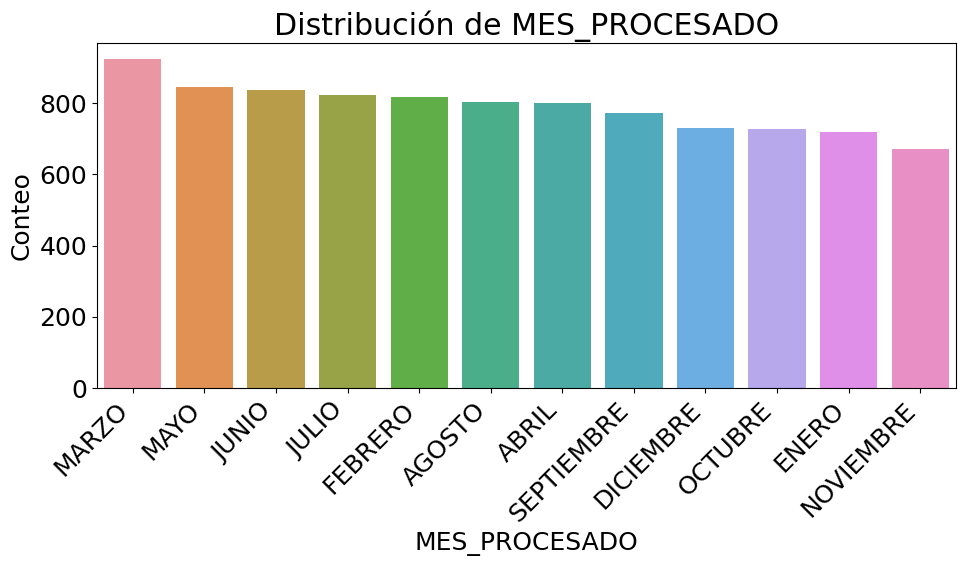

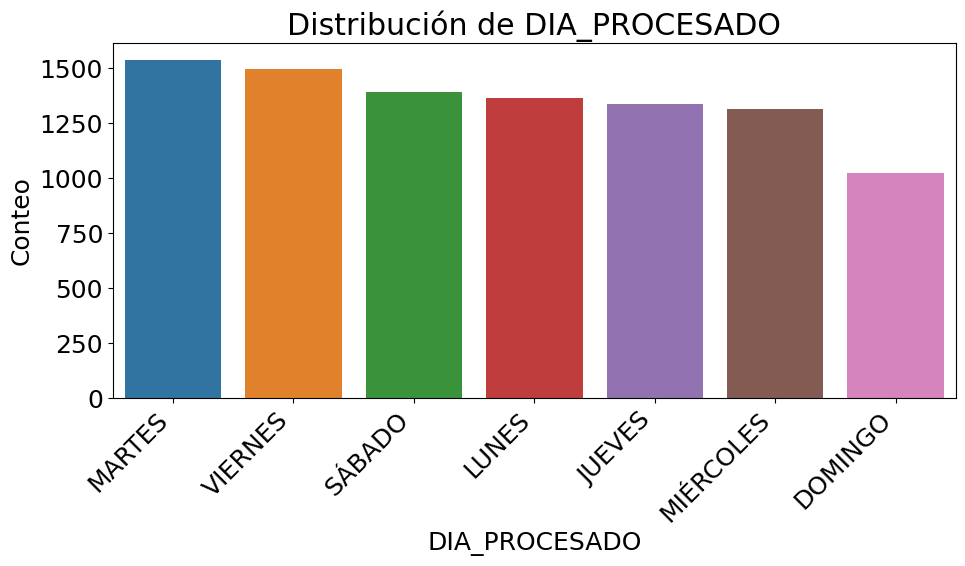

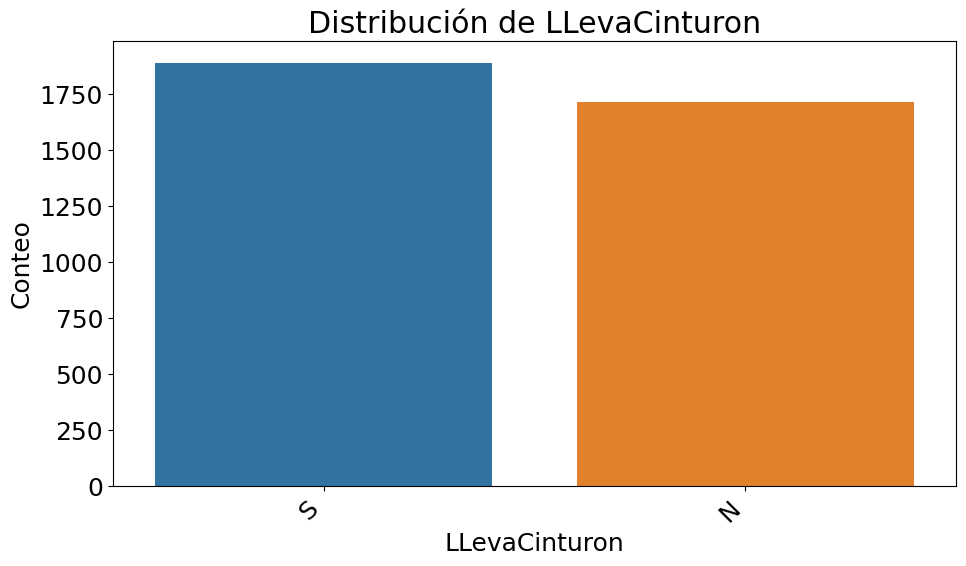

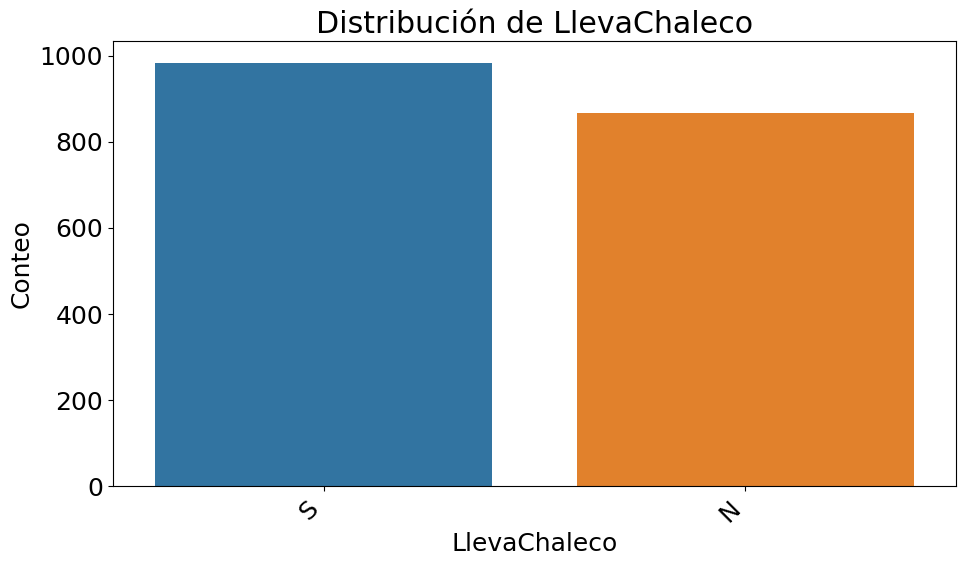

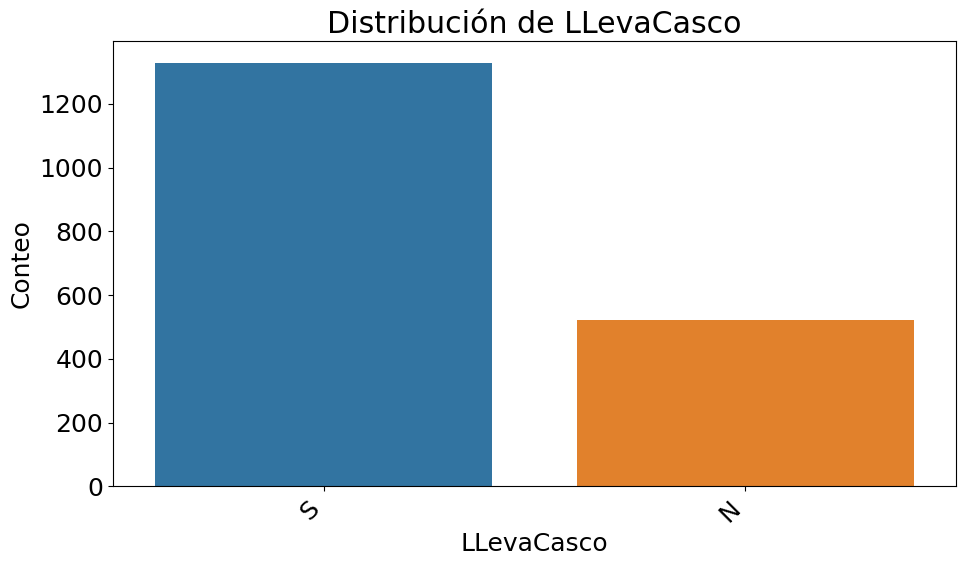

...

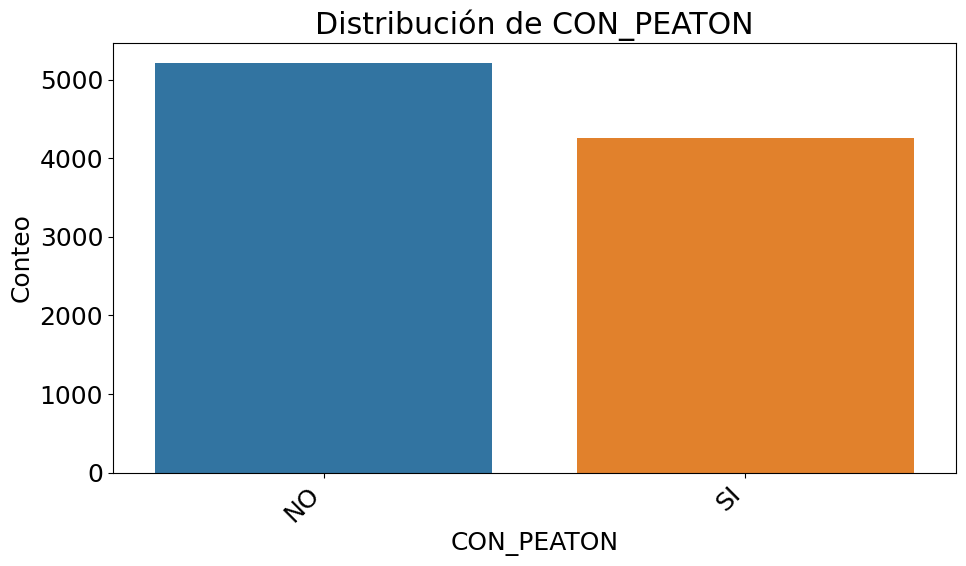

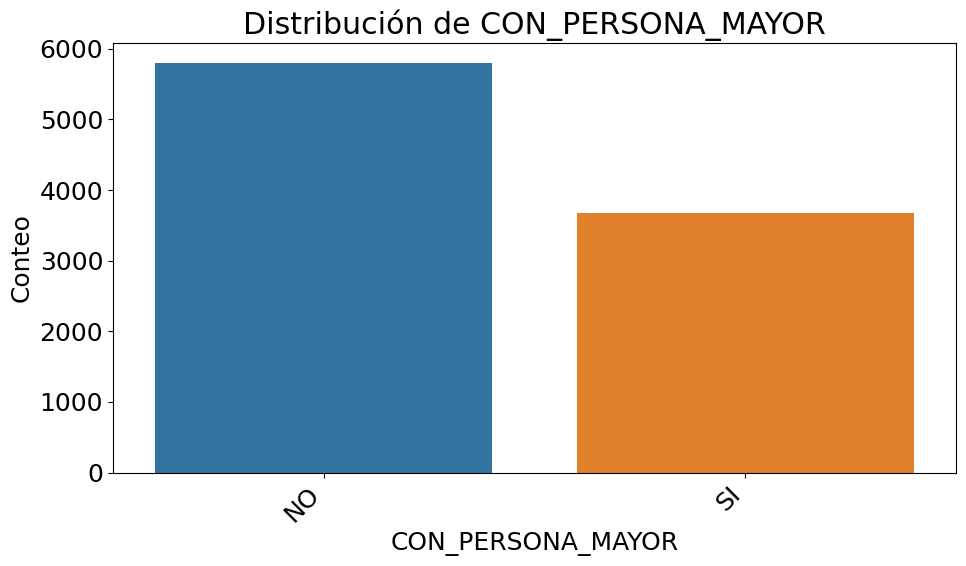

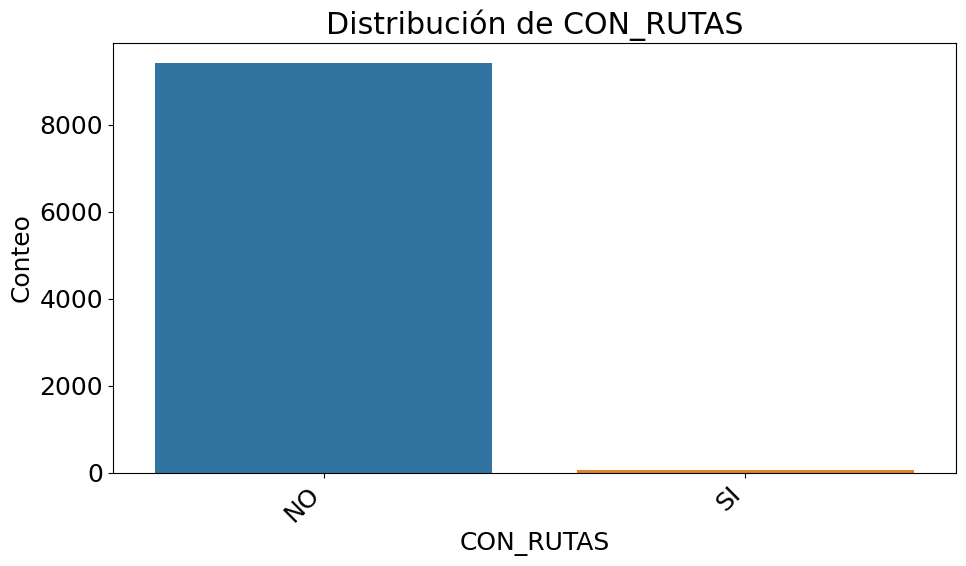

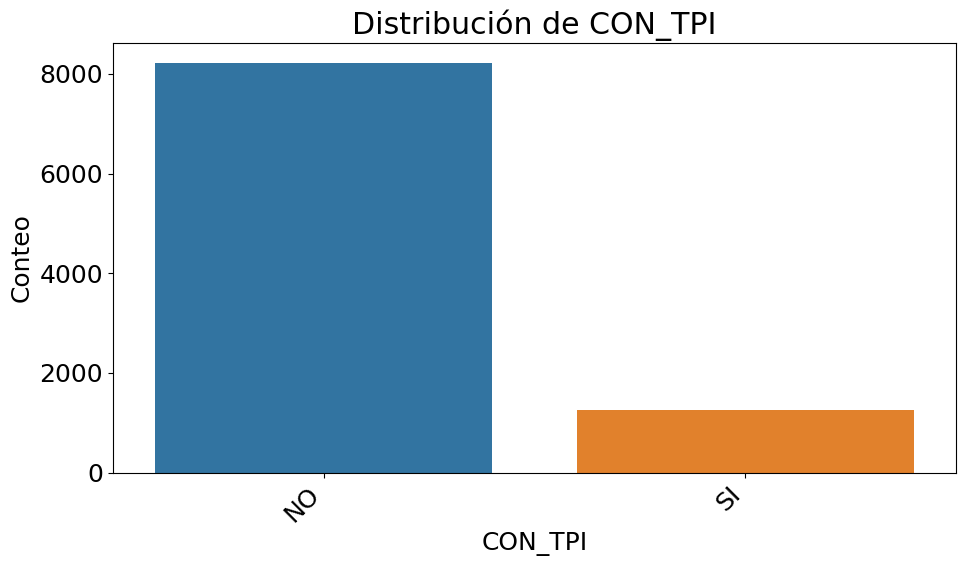

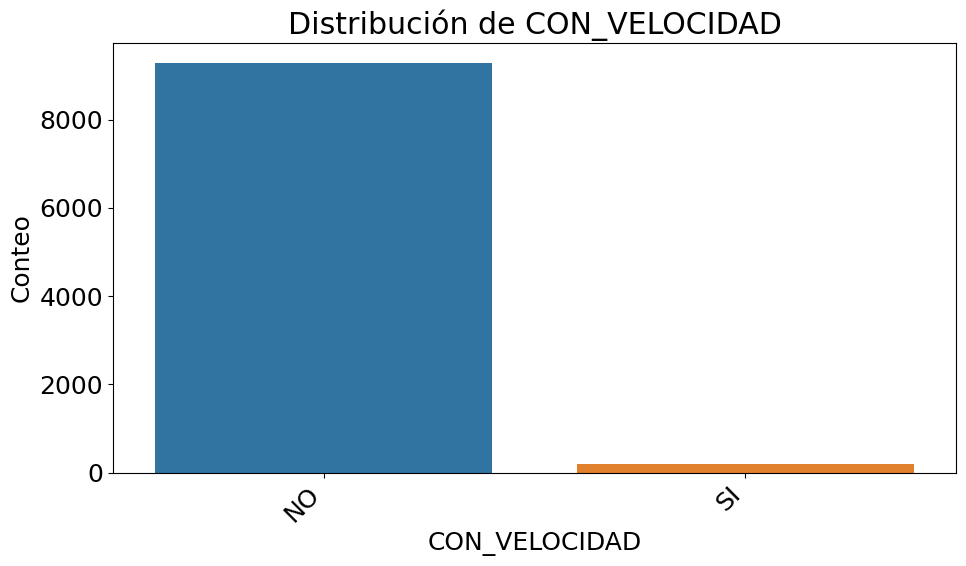

In [ ]:
columnas_con_pocos_valores_unicos = VICTIMAS2.columns[VICTIMAS2.nunique() <17]

# Crear boxplots solo para esas columnas
# Iterar sobre las columnas con pocos valores únicos
for columna in columnas_con_pocos_valores_unicos:
    tipo_columna = VICTIMAS2[columna].dtype

    # Si es numérico, crear un boxplot
    if pd.api.types.is_numeric_dtype(tipo_columna):
        plt.figure(figsize=(8, 6))
        VICTIMAS2.boxplot(column=columna, showfliers=False)
        plt.title(f'Boxplot de la columna {columna}')
        plt.ylabel('Valor')
        plt.show()
    # Si es de tipo string, crear un count plot
    elif pd.api.types.is_string_dtype(tipo_columna):
        plt.figure(figsize=(10, 6))
        sns.countplot(data=VICTIMAS2, x=columna, order=VICTIMAS2[columna].value_counts().index)
        plt.title(f'Distribución de {columna}')
        plt.xlabel(columna)
        plt.ylabel('Conteo')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()
    else:
        print(f'El tipo de la columna {columna} no es numérico ni string.')

In [ ]:
VICTIMAS2.dtypes

idFormulario                             int64
Fecha                           datetime64[ns]
MES_PROCESADO                           object
DIA_PROCESADO                           object
Numero                                   int64
EDAD_PROCESADA                          object
LLevaCinturon                           object
LlevaChaleco                            object
LLevaCasco                              object
Peaton_Pasajero                         object
CodigoVehiculo                           int64
Sexo                                    object
GRAVEDAD_PROCESADA                      object
ClaseOficial                            object
VEHICULO_VIAJABA                        object
VEHICULO_VIAJABA_CLASIFICADO            object
CON_BICICLETA                           object
CON_CARGA                               object
CON_EMBRIAGUEZ                          object
CON_HUECOS                              object
CON_MENORES                             object
CON_MOTO     

In [ ]:
VICTIMAS2["EDAD_PROCESADA"].unique()

array(['32', '24', '43', '40', '20', '66', '22', '57', '72', '19', '48',
       '52', '64', '16', '46', '77', '67', '27', '74', '54', '41', '60',
       '36', '34', '31', '71', '8', '10', '14', '53', '23', '35', '21',
       '3', '33', '15', '63', '2', '26', '42', '55', '59', '1', '69',
       '68', '13', '29', '9', '47', '45', '49', '25', '0', '73', '28',
       '51', 'SIN INFORMACION', '4', '11', '80', '86', '39', '56', '37',
       '18', '58', '44', '30', '61', '5', '38', '95', '87', '50', '7',
       '65', '62', '70', '17', '79', '84', '12', '83', '81', '75', '118',
       '76', '85', '6', '92', '82', '89', '91', '78', '90', '93', '88',
       '94', '98', '96', '119', '-1'], dtype=object)

In [ ]:

VICTIMAS2['EDAD_PROCESADA'] = pd.to_numeric(VICTIMAS2['EDAD_PROCESADA'], errors='coerce')
VICTIMAS2["EDAD_PROCESADA"].unique()

<ipython-input-245-f83120c56e4d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  VICTIMAS2['EDAD_PROCESADA'] = pd.to_numeric(VICTIMAS2['EDAD_PROCESADA'], errors='coerce')


array([ 32.,  24.,  43.,  40.,  20.,  66.,  22.,  57.,  72.,  19.,  48.,
        52.,  64.,  16.,  46.,  77.,  67.,  27.,  74.,  54.,  41.,  60.,
        36.,  34.,  31.,  71.,   8.,  10.,  14.,  53.,  23.,  35.,  21.,
         3.,  33.,  15.,  63.,   2.,  26.,  42.,  55.,  59.,   1.,  69.,
        68.,  13.,  29.,   9.,  47.,  45.,  49.,  25.,   0.,  73.,  28.,
        51.,  nan,   4.,  11.,  80.,  86.,  39.,  56.,  37.,  18.,  58.,
        44.,  30.,  61.,   5.,  38.,  95.,  87.,  50.,   7.,  65.,  62.,
        70.,  17.,  79.,  84.,  12.,  83.,  81.,  75., 118.,  76.,  85.,
         6.,  92.,  82.,  89.,  91.,  78.,  90.,  93.,  88.,  94.,  98.,
        96., 119.,  -1.])

In [ ]:
from sklearn.impute import KNNImputer
# Crear un KNNImputer con el número de vecinos deseado
knn_imputer = KNNImputer(n_neighbors=5)

# Imputar los valores faltantes en la columna 'EDAD PROCESADA'
VICTIMAS2['EDAD_PROCESADA'] = knn_imputer.fit_transform(VICTIMAS2[['EDAD_PROCESADA']])
VICTIMAS2['EDAD_PROCESADA2'] = knn_imputer.fit_transform(VICTIMAS2[['EDAD_PROCESADA']])

<ipython-input-246-9ed8ae31d18a>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  VICTIMAS2['EDAD_PROCESADA'] = knn_imputer.fit_transform(VICTIMAS2[['EDAD_PROCESADA']])
<ipython-input-246-9ed8ae31d18a>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  VICTIMAS2['EDAD_PROCESADA2'] = knn_imputer.fit_transform(VICTIMAS2[['EDAD_PROCESADA']])


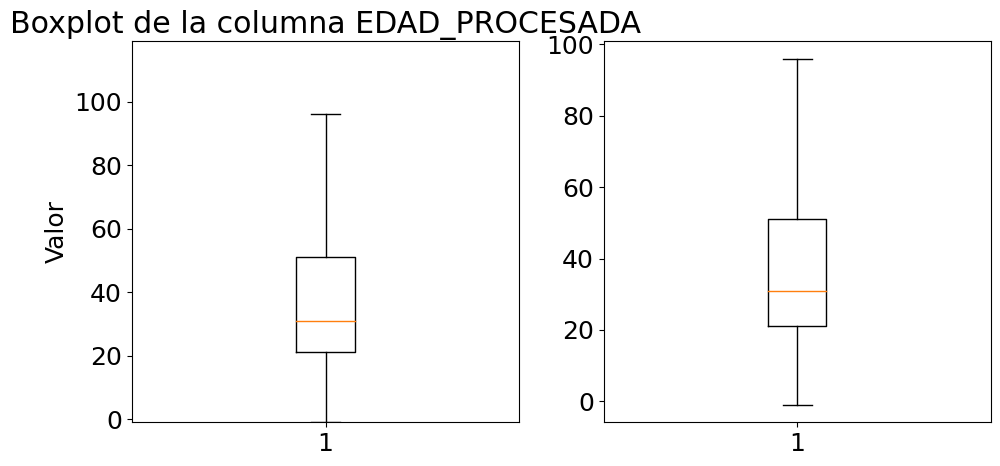

In [ ]:
# Crear una figura con dos subtramas una al lado de la otra
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Obtener los valores máximos y mínimos de ambas columnas
min_value = min(VICTIMAS2['EDAD_PROCESADA'].min(), VICTIMAS2['EDAD_PROCESADA2'].min())
max_value = max(VICTIMAS2['EDAD_PROCESADA'].max(), VICTIMAS2['EDAD_PROCESADA2'].max())

# Boxplot de la columna EDAD_PROCESADA en la primera subtrama
axes[0].boxplot(VICTIMAS2['EDAD_PROCESADA'], showfliers=False)
axes[0].set_title('Boxplot de la columna EDAD_PROCESADA')
axes[0].set_ylabel('Valor')
axes[0].set_ylim(min_value, max_value)  # Establecer el mismo rango en el eje y

# Boxplot de la columna EDAD_PROCESADA2 en la segunda subtrama
axes[1].boxplot(VICTIMAS2['EDAD_PROCESADA2'], showfliers=False)
# axes[1].set_title('Boxplot de la columna EDAD_PROCESADA2')
# axes[1].set_ylabel('Valor')
# axes[1].set_ylim(min_value, max_value)  # Establecer el mismo rango en el eje y

# Ajustar el espacio entre las subtramas
plt.tight_layout()

# Mostrar el gráfico
plt.show()

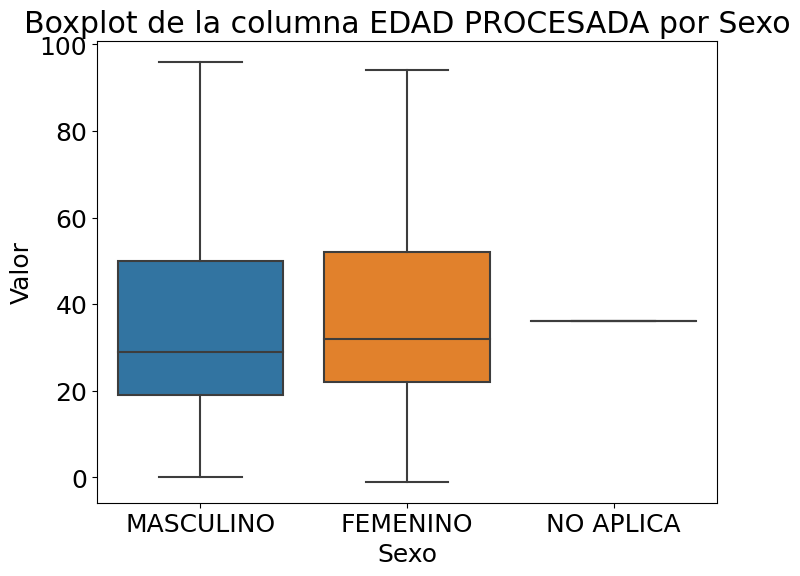

In [ ]:
# Crear un boxplot de la columna 'EDAD PROCESADA'
plt.figure(figsize=(8, 6))
sns.boxplot(data=VICTIMAS2, x='Sexo', y='EDAD_PROCESADA2', showfliers=False)
plt.title('Boxplot de la columna EDAD PROCESADA por Sexo')
plt.ylabel('Valor')
plt.xlabel('Sexo')
plt.show()

In [ ]:
media_edad = VICTIMAS2['EDAD_PROCESADA'].mean()

# Reemplazar los valores NaN por la media en la columna 'EDAD PROCESADA'
VICTIMAS2['EDAD_PROCESADA'].fillna(media_edad, inplace=True)

<ipython-input-249-292ce198524f>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  VICTIMAS2['EDAD_PROCESADA'].fillna(media_edad, inplace=True)


In [ ]:
 VICTIMAS2['VEHICULO_VIAJABA'].unique()

array(['PEATON', 'AUTOMOVIL', 'MOTOCICLETA', 'BUS', 'CAMIONETA', 'BUSETA',
       'BICICLETA', 'MICROBUS', 'CAMPERO', 'CAMION, FURGON',
       'TRACTOCAMION', 'VOLQUETA', 'BICITAXI', nan], dtype=object)

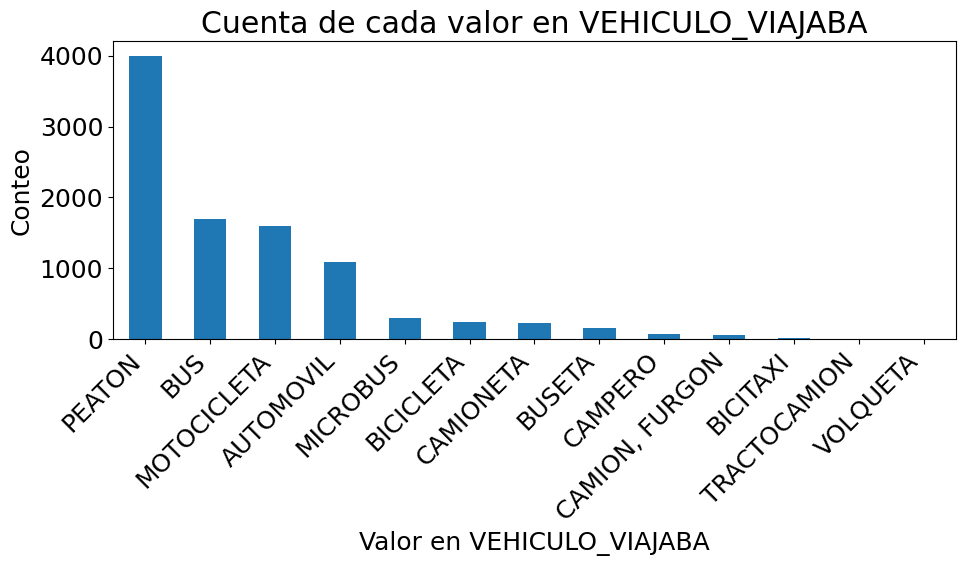

In [ ]:
# Crear un gráfico de barras con la cuenta de cada valor en 'VEHICULO_VIAJABA'
plt.figure(figsize=(10, 6))
VICTIMAS2['VEHICULO_VIAJABA'].value_counts().plot(kind='bar')
plt.title('Cuenta de cada valor en VEHICULO_VIAJABA')
plt.xlabel('Valor en VEHICULO_VIAJABA')
plt.ylabel('Conteo')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [ ]:
VICTIMAS2['GRAVEDAD_PROCESADA'].unique()

array(['HERIDO VALORADO', 'HERIDO HOSPITALIZADO', 'MUERTA'], dtype=object)

In [ ]:
VICTIMAS2["CodigoVehiculo"].unique()

array([0, 2, 1, 3, 4, 5, 6])

In [ ]:
# columnas_a_eliminar = VICTIMAS2.filter(like='CON_').columns
# VICTIMAS2.drop(columns=columnas_a_eliminar, inplace=True)


# VICTIMAS2.dtypes

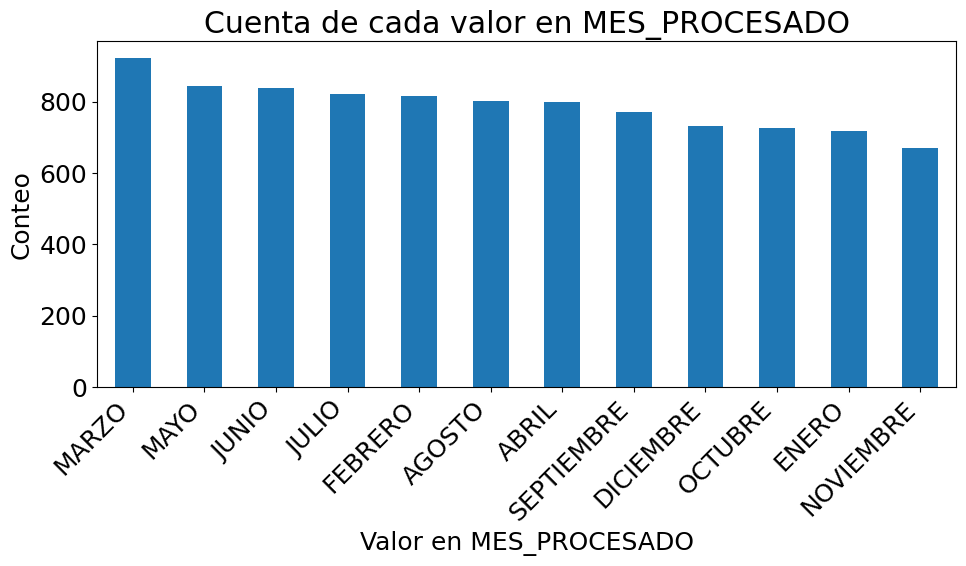

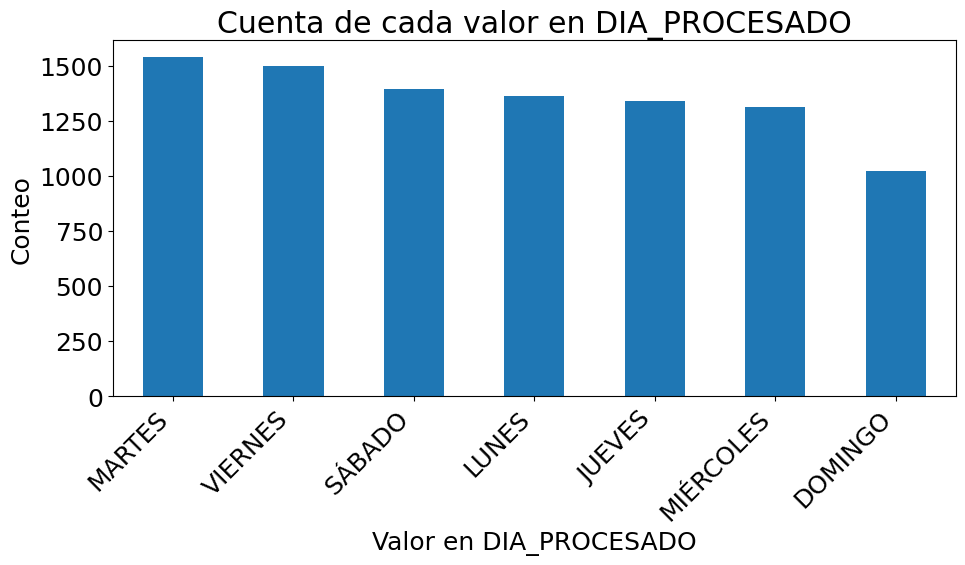

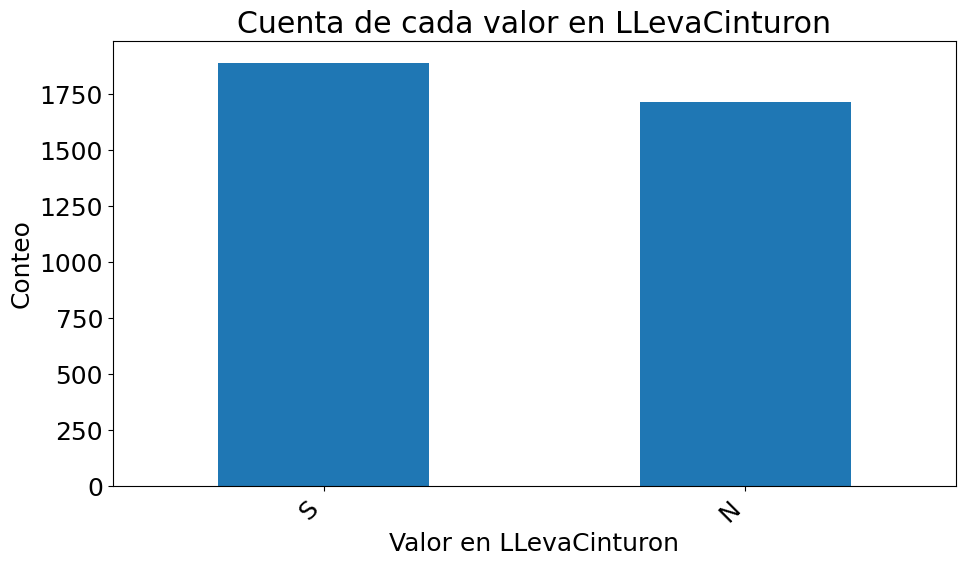

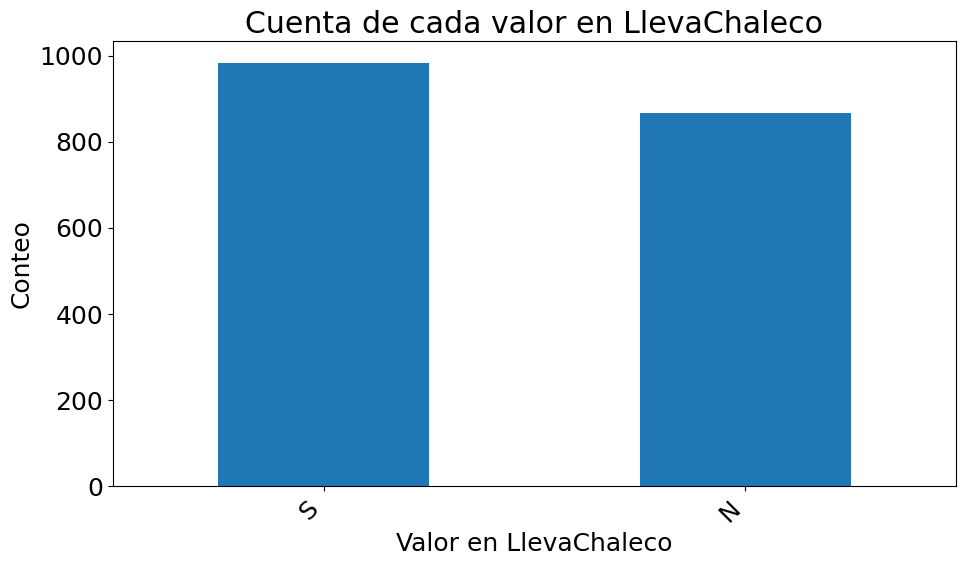

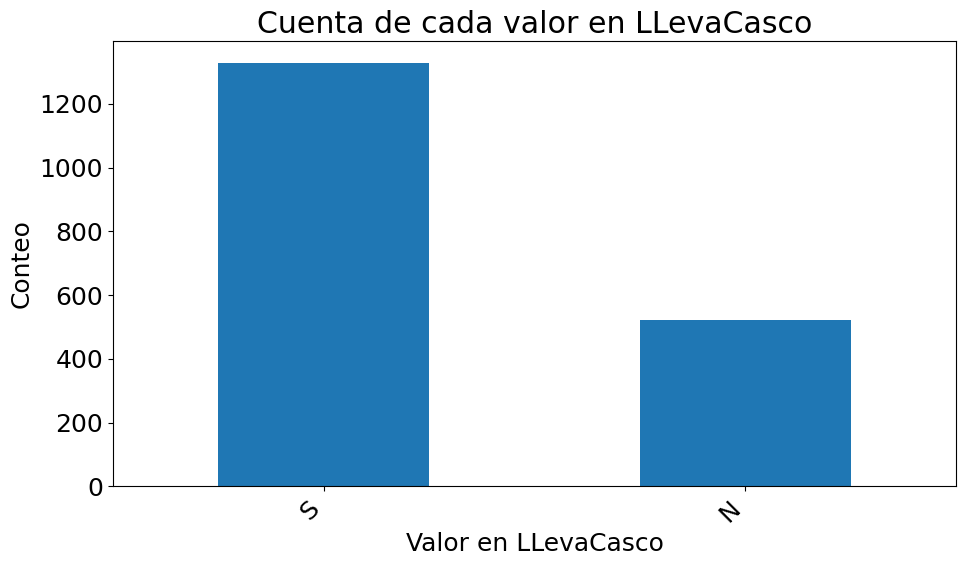

...

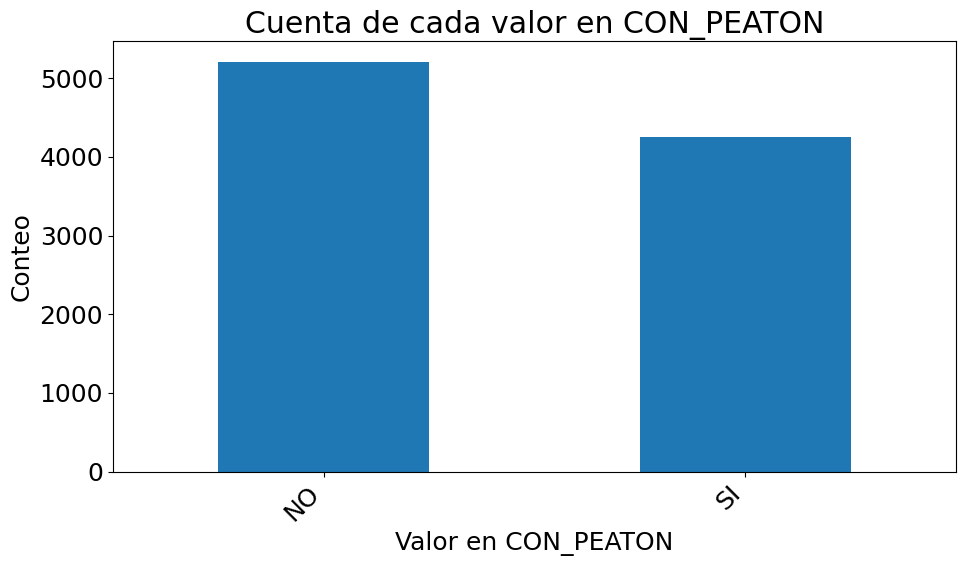

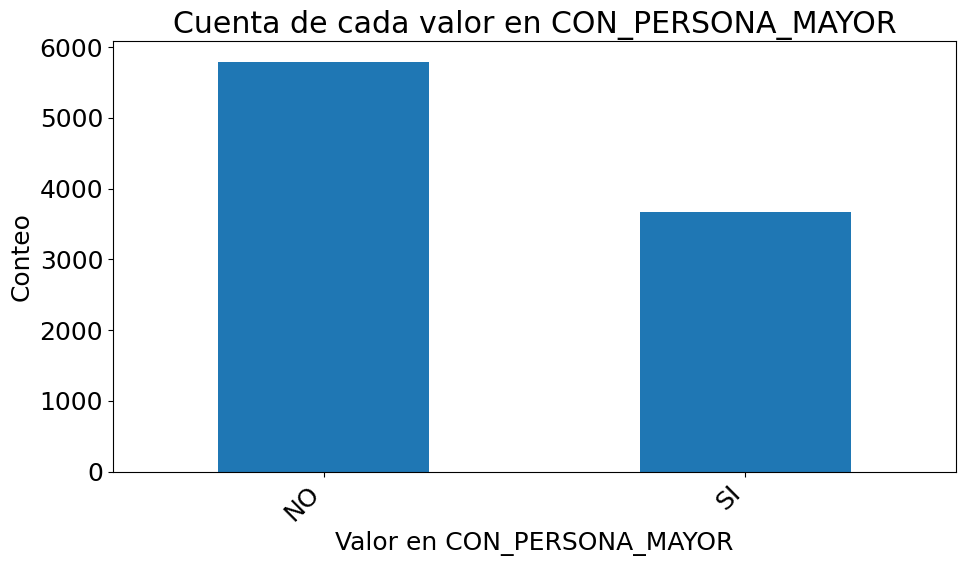

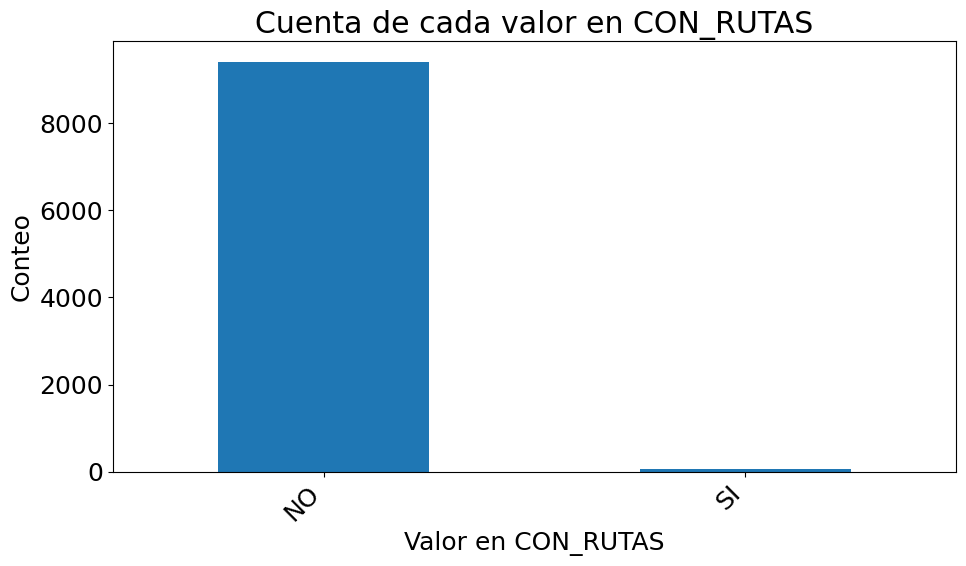

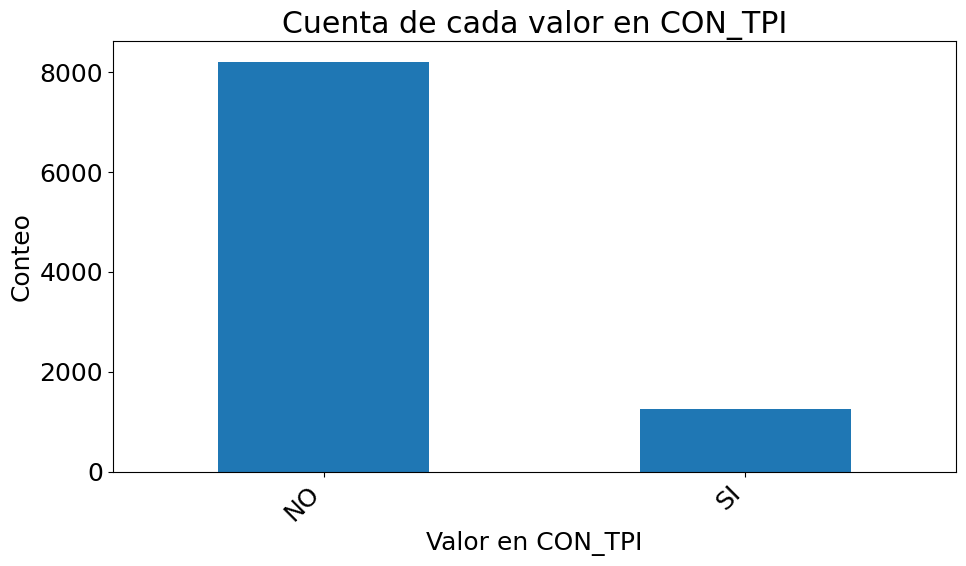

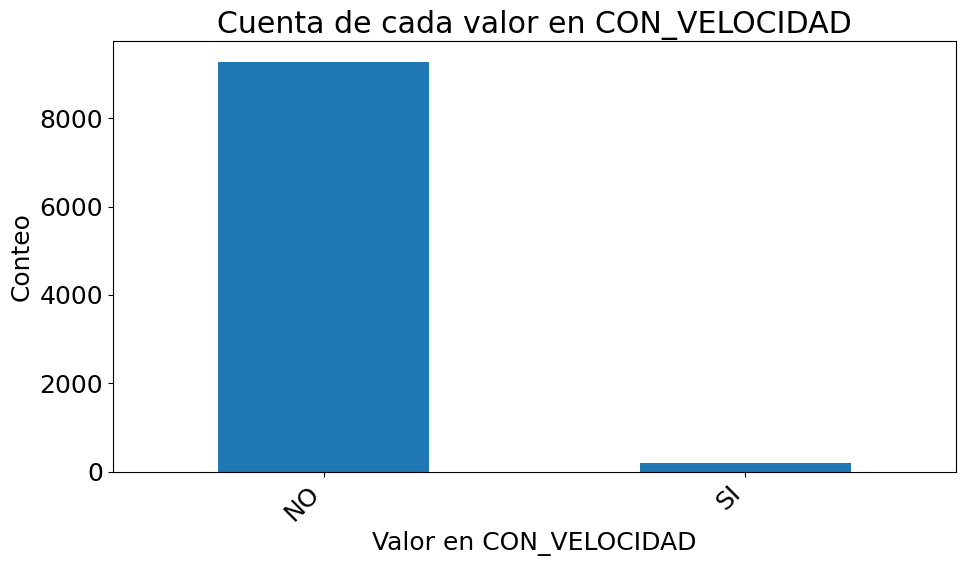

In [ ]:
# Iterar por cada columna en el DataFrame
for columna in VICTIMAS2.columns:
    if VICTIMAS2[columna].dtype == 'object':  # Verificar si la columna es categórica
        # Crear un gráfico de barras con la cuenta de cada valor en la columna categórica
        plt.figure(figsize=(10, 6))
        VICTIMAS2[columna].value_counts().plot(kind='bar')
        plt.title(f'Cuenta de cada valor en {columna}')
        plt.xlabel(f'Valor en {columna}')
        plt.ylabel('Conteo')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

In [ ]:
# Diccionario de meses en español a números
meses_a_numeros = {
    'ENERO': 1,
    'FEBRERO': 2,
    'MARZO': 3,
    'ABRIL': 4,
    'MAYO': 5,
    'JUNIO': 6,
    'JULIO': 7,
    'AGOSTO': 8,
    'SEPTIEMBRE': 9,
    'OCTUBRE': 10,
    'NOVIEMBRE': 11,
    'DICIEMBRE': 12
}

# Aplicar el mapeo al DataFrame VICTIMAS2
VICTIMAS2['MES_PROCESADO2'] = VICTIMAS2['MES_PROCESADO'].map(meses_a_numeros)

<ipython-input-256-8143f482e733>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  VICTIMAS2['MES_PROCESADO2'] = VICTIMAS2['MES_PROCESADO'].map(meses_a_numeros)


In [ ]:
# Diccionario de reemplazo
diccionario_reemplazo = {
    'HERIDO VALORADO': 2,
    'HERIDO HOSPITALIZADO': 3,
    'MUERTA': 5
}

# Aplicar el reemplazo en la columna 'GRAVEDAD PROCESADA'
VICTIMAS2['GRAVEDAD_PROCESADA2'] = VICTIMAS2['GRAVEDAD_PROCESADA'].replace(diccionario_reemplazo)

<ipython-input-257-5fc009f0d20e>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  VICTIMAS2['GRAVEDAD_PROCESADA2'] = VICTIMAS2['GRAVEDAD_PROCESADA'].replace(diccionario_reemplazo)


In [ ]:
VICTIMAS2['GRAVEDAD_PROCESADA2']

0       2
1       2
2       2
3       2
4       2
       ..
9460    2
9461    2
9462    2
9463    2
9464    2
Name: GRAVEDAD_PROCESADA2, Length: 9465, dtype: int64

In [ ]:
# Diccionario de reemplazo
diccionario_reemplazo = {
    'HERIDO VALORADO': 2,
    'HERIDO HOSPITALIZADO': 3,
    'MUERTA': 5
}

# Aplicar el reemplazo en la columna 'GRAVEDAD PROCESADA'
VICTIMAS2['GRAVEDAD_PROCESADA2'] = VICTIMAS2['GRAVEDAD_PROCESADA'].replace(diccionario_reemplazo)

<ipython-input-259-5fc009f0d20e>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  VICTIMAS2['GRAVEDAD_PROCESADA2'] = VICTIMAS2['GRAVEDAD_PROCESADA'].replace(diccionario_reemplazo)


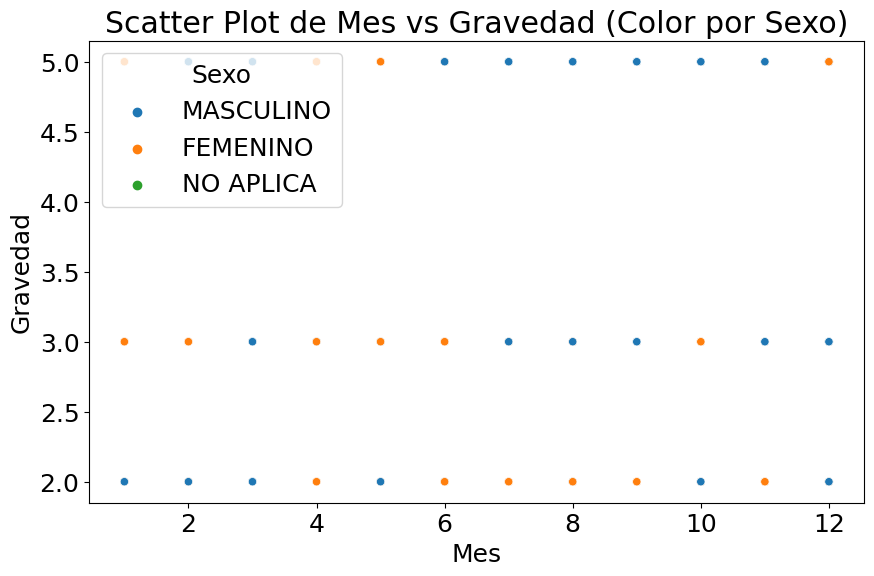

In [ ]:
# Crear un scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=VICTIMAS2, x='MES_PROCESADO2', y='GRAVEDAD_PROCESADA2', hue='Sexo')
plt.title('Scatter Plot de Mes vs Gravedad (Color por Sexo)')
plt.xlabel('Mes')
plt.ylabel('Gravedad')
plt.legend(title='Sexo')
plt.show()


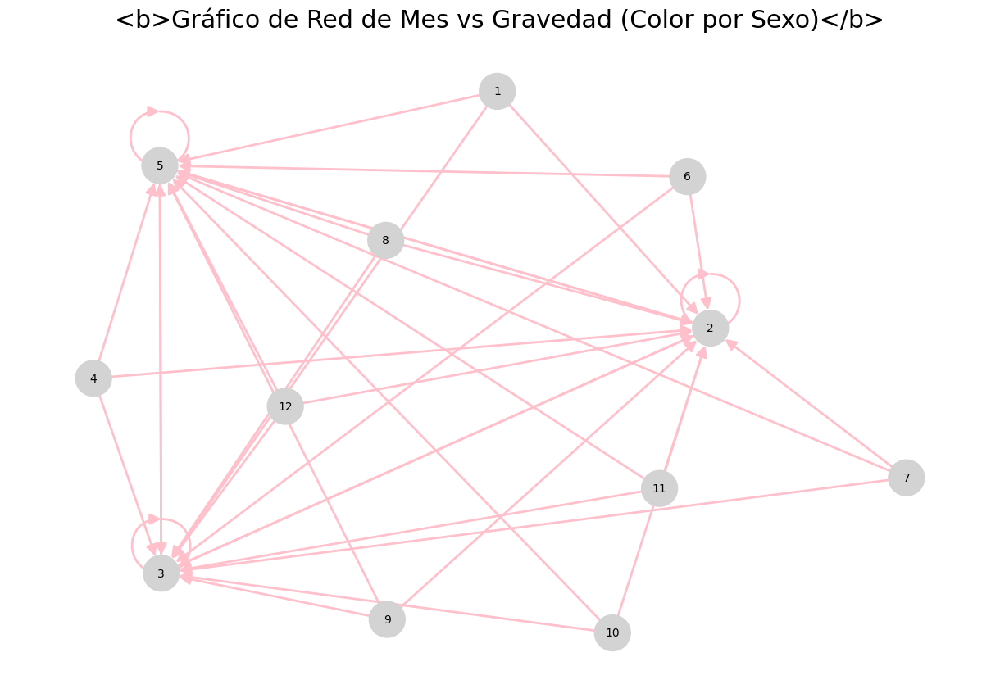

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Supongamos que tienes un DataFrame llamado VICTIMAS2
# Asegúrate de que 'MES_PROCESADO2', 'GRAVEDAD_PROCESADA2' y 'Sexo' sean nombres de columnas válidos en tu DataFrame

# Crear un objeto de grafo dirigido
G = nx.DiGraph()

# Agregar nodos para cada mes
meses = VICTIMAS2['MES_PROCESADO2'].unique()
G.add_nodes_from(meses, bipartite=0)

# Agregar nodos para cada gravedad y asignar colores personalizados
gravedades = VICTIMAS2['GRAVEDAD_PROCESADA2'].unique()
gravedad_colors = {
    '1': 'blue',    # Cambia 'Gravedad1' por el nombre real de tu categoría de gravedad
    '3': 'darkblue',
    '5': 'red',
    # Cambia 'Gravedad2' por el nombre real de tu categoría de gravedad
    # Agrega más categorías de gravedad y colores personalizados según sea necesario
}
G.add_nodes_from(gravedades, bipartite=1, color=[gravedad_colors.get(gravedad, 'lightgray') for gravedad in gravedades])

# Agregar bordes entre mes y gravedad con colores basados en el sexo
for _, row in VICTIMAS2.iterrows():
    mes = row['MES_PROCESADO2']
    gravedad = row['GRAVEDAD_PROCESADA2']
    sexo = row['Sexo']
    color = 'blue' if sexo == 'Hombre' else 'pink'
    G.add_edge(mes, gravedad, color=color)


# Dibujar el gráfico de red
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, seed=42)
edge_colors = [G[u][v]['color'] for u, v in G.edges]
node_colors = [gravedad_colors.get(n, 'lightgray') for n in G.nodes]
nx.draw(G, pos, node_color=node_colors, node_size=1000, with_labels=True, font_size=10, font_color='black', edge_color=edge_colors, width=2, arrowsize=20)
plt.title('<b>Gráfico de Red de Mes vs Gravedad (Color por Sexo)</b>')
plt.show()

<Figure size 2000x2000 with 0 Axes>

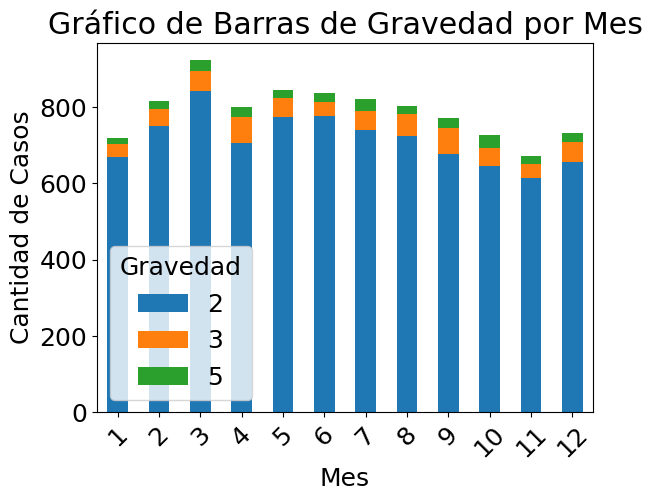

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Agrupar los datos por mes y gravedad y contar la cantidad de casos
grouped = VICTIMAS2.groupby(['MES_PROCESADO2', 'GRAVEDAD_PROCESADA2']).size().unstack().fillna(0)

# Crear un gráfico de barras apiladas
plt.figure(figsize=(20, 20))
grouped.plot(kind='bar', stacked=True)
plt.title('Gráfico de Barras de Gravedad por Mes')
plt.xlabel('Mes')
plt.ylabel('Cantidad de Casos')
plt.legend(title='Gravedad')
plt.xticks(rotation=45)
plt.show()


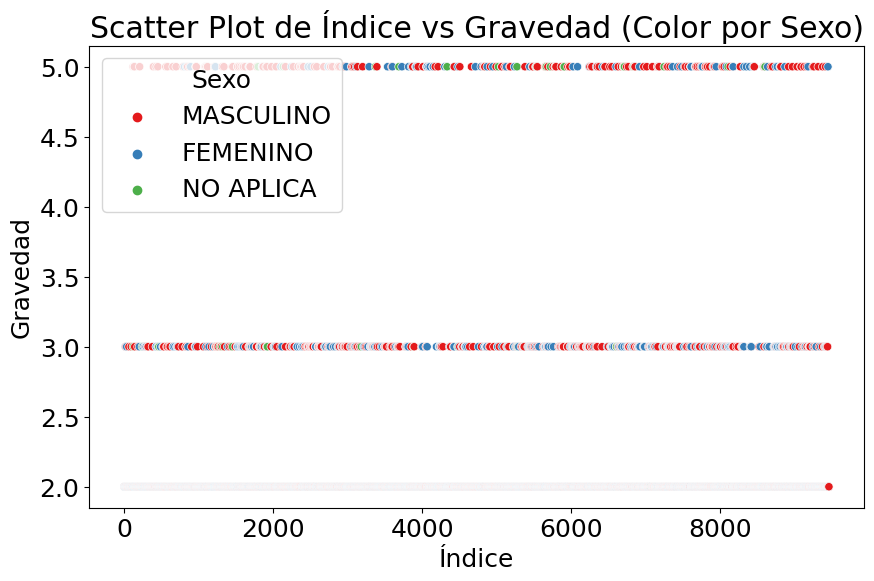

In [ ]:
# Crear un scatter plot con colores por sexo
# Crear un scatter plot con colores por sexo
plt.figure(figsize=(10, 6))
sns.scatterplot(data=VICTIMAS2, x=VICTIMAS2.index, y='GRAVEDAD_PROCESADA2', hue='Sexo', palette='Set1')
plt.title('Scatter Plot de Índice vs Gravedad (Color por Sexo)')
plt.xlabel('Índice')
plt.ylabel('Gravedad')
plt.legend(title='Sexo')
plt.show()

In [ ]:
VICTIMAS2['Numero'].unique()

array([ 1,  2,  3,  4,  6,  5,  7,  8,  9, 12, 13, 14, 15, 11, 10, 23, 27,
       28, 29, 31, 20, 24, 26, 32, 35, 37, 16, 17, 19, 25, 33, 36, 21, 34,
       38, 18, 22, 30, 42, 40, 44, 54, 50, 57, 39, 43, 45, 48, 58, 51, 52,
       41, 49, 55, 56, 46, 47, 53, 60, 64, 63, 59, 62, 61])

In [ ]:
columnas_a_eliminar = ['Fecha', 'EDAD_PROCESADA']
VICTIMAS3 =pd.DataFrame(VICTIMAS2.drop(columns=columnas_a_eliminar, inplace=True))

<ipython-input-265-efde497b44f4>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  VICTIMAS3 =pd.DataFrame(VICTIMAS2.drop(columns=columnas_a_eliminar, inplace=True))


In [ ]:
VICTIMAS3.shape

(0, 0)

In [ ]:
VICTIMAS2.dtypes

idFormulario                      int64
MES_PROCESADO                    object
DIA_PROCESADO                    object
Numero                            int64
LLevaCinturon                    object
LlevaChaleco                     object
LLevaCasco                       object
Peaton_Pasajero                  object
CodigoVehiculo                    int64
Sexo                             object
GRAVEDAD_PROCESADA               object
ClaseOficial                     object
VEHICULO_VIAJABA                 object
VEHICULO_VIAJABA_CLASIFICADO     object
CON_BICICLETA                    object
CON_CARGA                        object
CON_EMBRIAGUEZ                   object
CON_HUECOS                       object
CON_MENORES                      object
CON_MOTO                         object
CON_PEATON                       object
CON_PERSONA_MAYOR                object
CON_RUTAS                        object
CON_TPI                          object
CON_VELOCIDAD                    object


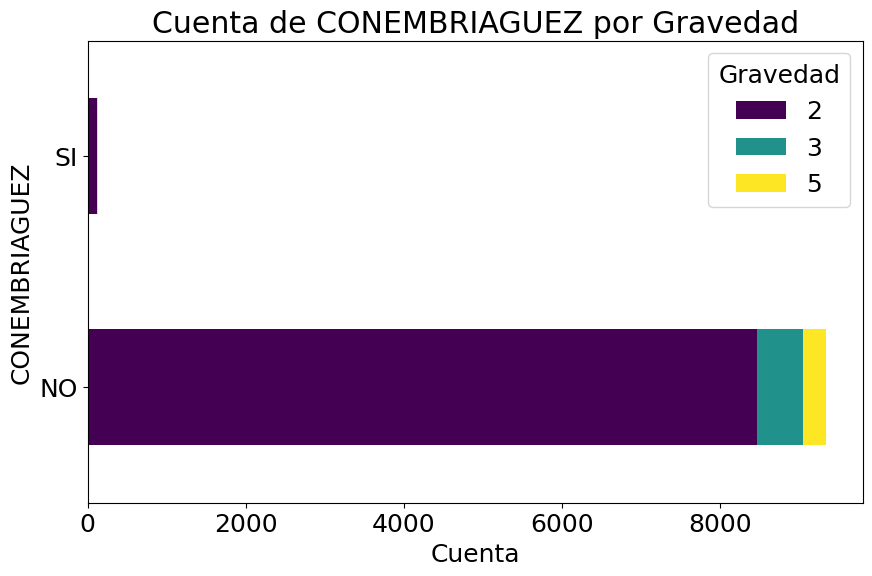

In [ ]:
# Agrupar por 'CONEMBRIAGUEZ' y contar las ocurrencias para cada 'GRAVEDAD2'
data = VICTIMAS2.groupby(['CON_EMBRIAGUEZ', 'GRAVEDAD_PROCESADA2']).size().unstack()

# Crear un gráfico de barras apiladas horizontal
data.plot(kind='barh', stacked=True, colormap='viridis', figsize=(10, 6))

# Personalizar el gráfico
plt.title('Cuenta de CONEMBRIAGUEZ por Gravedad')
plt.ylabel('CONEMBRIAGUEZ')
plt.xlabel('Cuenta')
plt.legend(title='Gravedad')

# Mostrar el gráfico
plt.show()


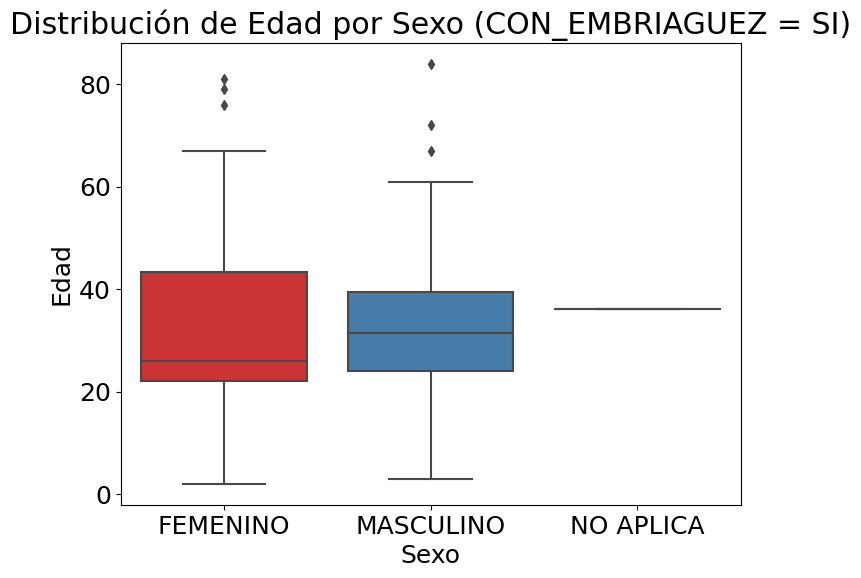

In [ ]:
# Filtrar las filas donde 'CONEMBRIAGUEZ' sea igual a 'SI'
victimas_embriaguez_si = VICTIMAS2[VICTIMAS2['CON_EMBRIAGUEZ'] == 'SI']


# Crear un boxplot de la edad por sexo
plt.figure(figsize=(8, 6))
sns.boxplot(data=victimas_embriaguez_si, x='Sexo', y='EDAD_PROCESADA2', palette='Set1')
plt.title('Distribución de Edad por Sexo (CON_EMBRIAGUEZ = SI)')
plt.xlabel('Sexo')
plt.ylabel('Edad')
plt.show()

In [ ]:
# Agrupar por 'Sexo' y calcular el promedio de 'GRAVEDAD2'
promedio_gravedad_por_sexo = VICTIMAS2.groupby('Sexo')['GRAVEDAD_PROCESADA2'].mean()
promedio_gravedad_por_sexo

Sexo
FEMENINO     2.098417
MASCULINO    2.215809
NO APLICA    3.459016
Name: GRAVEDAD_PROCESADA2, dtype: float64

In [ ]:
gravedad_por_sexo = VICTIMAS2.groupby('Sexo')['GRAVEDAD_PROCESADA2']
print(gravedad_por_sexo)

In [ ]:
VICTIMAS2.columns

Index(['idFormulario', 'MES_PROCESADO', 'DIA_PROCESADO', 'Numero',
       'LLevaCinturon', 'LlevaChaleco', 'LLevaCasco', 'Peaton_Pasajero',
       'CodigoVehiculo', 'Sexo', 'GRAVEDAD_PROCESADA', 'ClaseOficial',
       'VEHICULO_VIAJABA', 'VEHICULO_VIAJABA_CLASIFICADO', 'CON_BICICLETA',
       'CON_CARGA', 'CON_EMBRIAGUEZ', 'CON_HUECOS', 'CON_MENORES', 'CON_MOTO',
       'CON_PEATON', 'CON_PERSONA_MAYOR', 'CON_RUTAS', 'CON_TPI',
       'CON_VELOCIDAD', 'EDAD_PROCESADA2', 'MES_PROCESADO2',
       'GRAVEDAD_PROCESADA2'],
      dtype='object')

In [ ]:
VICTIMAS2

,idFormulario,MES_PROCESADO,DIA_PROCESADO,Numero,LLevaCinturon,LlevaChaleco,LLevaCasco,Peaton_Pasajero,CodigoVehiculo,Sexo,...,CON_MENORES,CON_MOTO,CON_PEATON,CON_PERSONA_MAYOR,CON_RUTAS,CON_TPI,CON_VELOCIDAD,EDAD_PROCESADA2,MES_PROCESADO2,GRAVEDAD_PROCESADA2
0,1,ENERO,LUNES,1,NaN,NaN,NaN,Peaton,0,MASCULINO,...,NO,NO,SI,SI,NO,NO,NO,32.0,1,2
1,8,ENERO,VIERNES,1,S,NaN,NaN,Acompañante,2,FEMENINO,...,NO,NO,NO,SI,NO,NO,NO,24.0,1,2
2,8,ENERO,VIERNES,2,S,NaN,NaN,Acompañante,2,MASCULINO,...,NO,NO,NO,SI,NO,NO,NO,43.0,1,2
3,8,ENERO,VIERNES,3,S,NaN,NaN,Acompañante,2,MASCULINO,...,NO,NO,NO,SI,NO,NO,NO,32.0,1,2
4,9,ENERO,JUEVES,1,NaN,NaN,NaN,Peaton,0,FEMENINO,...,NO,SI,SI,NO,NO,NO,NO,40.0,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9460,34953,DICIEMBRE,LUNES,1,NaN,NaN,NaN,Peaton,0,MASCULINO,...,NO,NO,SI,SI,NO,NO,NO,72.0,12,2
9461,34954,DICIEMBRE,MARTES,1,NaN,NaN,NaN,Peaton,0,MASCULINO,...,NO,NO,SI,SI,NO,SI,NO,78.0,12,2
9462,34959,DICIEMBRE,LUNES,1,N,NaN,NaN,Pasajero,2,FEMENINO,...,NO,NO,NO,NO,NO,NO,NO,33.0,12,2
9463,34978,DICIEMBRE,LUNES,1,NaN,NaN,NaN,Peaton,0,FEMENINO,...,SI,NO,SI,NO,NO,NO,NO,16.0,12,2


In [ ]:
# Obtener las columnas que comienzan con 'Lleva' o 'LLeva'
columnas_a_reemplazar = [columna for columna in VICTIMAS2.columns if columna.lower().startswith('lleva')]

# Reemplazar 'S' con 1 y 'N' con -1 en las columnas seleccionadas
VICTIMAS2[columnas_a_reemplazar] = VICTIMAS2[columnas_a_reemplazar].replace({'S': 1, 'N': -1})

<ipython-input-274-4f580b27a932>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  VICTIMAS2[columnas_a_reemplazar] = VICTIMAS2[columnas_a_reemplazar].replace({'S': 1, 'N': -1})


In [ ]:
columnas_a_reemplazar

['LLevaCinturon', 'LlevaChaleco', 'LLevaCasco']

In [ ]:
VICTIMAS2.dtypes

idFormulario                      int64
MES_PROCESADO                    object
DIA_PROCESADO                    object
Numero                            int64
LLevaCinturon                   float64
LlevaChaleco                    float64
LLevaCasco                      float64
Peaton_Pasajero                  object
CodigoVehiculo                    int64
Sexo                             object
GRAVEDAD_PROCESADA               object
ClaseOficial                     object
VEHICULO_VIAJABA                 object
VEHICULO_VIAJABA_CLASIFICADO     object
CON_BICICLETA                    object
CON_CARGA                        object
CON_EMBRIAGUEZ                   object
CON_HUECOS                       object
CON_MENORES                      object
CON_MOTO                         object
CON_PEATON                       object
CON_PERSONA_MAYOR                object
CON_RUTAS                        object
CON_TPI                          object
CON_VELOCIDAD                    object


In [ ]:
VICTIMAS2["CON_MOTO"].unique()

array(['NO', 'SI'], dtype=object)

In [ ]:
# Obtener las columnas que comienzan con 'Lleva' o 'LLeva'
columnas_a_reemplazar2 = [columna for columna in VICTIMAS2.columns if columna.lower().startswith('con')]

# Reemplazar 'S' con 1 y 'N' con -1 en las columnas seleccionadas
VICTIMAS2[columnas_a_reemplazar2] = VICTIMAS2[columnas_a_reemplazar2].replace({'SI': 1, 'NO': -1})

<ipython-input-278-961b1e6d5e61>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  VICTIMAS2[columnas_a_reemplazar2] = VICTIMAS2[columnas_a_reemplazar2].replace({'SI': 1, 'NO': -1})


In [ ]:
VICTIMAS2.dtypes

idFormulario                      int64
MES_PROCESADO                    object
DIA_PROCESADO                    object
Numero                            int64
LLevaCinturon                   float64
LlevaChaleco                    float64
LLevaCasco                      float64
Peaton_Pasajero                  object
CodigoVehiculo                    int64
Sexo                             object
GRAVEDAD_PROCESADA               object
ClaseOficial                     object
VEHICULO_VIAJABA                 object
VEHICULO_VIAJABA_CLASIFICADO     object
CON_BICICLETA                     int64
CON_CARGA                         int64
CON_EMBRIAGUEZ                    int64
CON_HUECOS                        int64
CON_MENORES                       int64
CON_MOTO                          int64
CON_PEATON                        int64
CON_PERSONA_MAYOR                 int64
CON_RUTAS                         int64
CON_TPI                           int64
CON_VELOCIDAD                     int64


In [ ]:
# Crear un nuevo DataFrame con las columnas deseadas
VICTIMAS3 = VICTIMAS2[['DIA_PROCESADO', 'Numero', 'LLevaCinturon',
                             'LlevaChaleco', 'LLevaCasco', 'Peaton_Pasajero', 'CodigoVehiculo', 'Sexo',
                             'ClaseOficial', 'VEHICULO_VIAJABA', 'VEHICULO_VIAJABA_CLASIFICADO',
                             'CON_BICICLETA', 'CON_CARGA', 'CON_EMBRIAGUEZ', 'CON_HUECOS', 'CON_MENORES',
                             'CON_MOTO', 'CON_PEATON', 'CON_PERSONA_MAYOR', 'CON_RUTAS', 'CON_TPI', 'CON_VELOCIDAD',
                             'EDAD_PROCESADA2', 'MES_PROCESADO2', 'GRAVEDAD_PROCESADA2']]

# Mostrar las primeras filas del nuevo DataFrame
VICTIMAS3

,DIA_PROCESADO,Numero,LLevaCinturon,LlevaChaleco,LLevaCasco,Peaton_Pasajero,CodigoVehiculo,Sexo,ClaseOficial,VEHICULO_VIAJABA,...,CON_MENORES,CON_MOTO,CON_PEATON,CON_PERSONA_MAYOR,CON_RUTAS,CON_TPI,CON_VELOCIDAD,EDAD_PROCESADA2,MES_PROCESADO2,GRAVEDAD_PROCESADA2
0,LUNES,1,NaN,NaN,NaN,Peaton,0,MASCULINO,N,PEATON,...,-1,-1,1,1,-1,-1,-1,32.0,1,2
1,VIERNES,1,1.0,NaN,NaN,Acompañante,2,FEMENINO,N,AUTOMOVIL,...,-1,-1,-1,1,-1,-1,-1,24.0,1,2
2,VIERNES,2,1.0,NaN,NaN,Acompañante,2,MASCULINO,N,AUTOMOVIL,...,-1,-1,-1,1,-1,-1,-1,43.0,1,2
3,VIERNES,3,1.0,NaN,NaN,Acompañante,2,MASCULINO,N,AUTOMOVIL,...,-1,-1,-1,1,-1,-1,-1,32.0,1,2
4,JUEVES,1,NaN,NaN,NaN,Peaton,0,FEMENINO,N,PEATON,...,-1,1,1,-1,-1,-1,-1,40.0,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9460,LUNES,1,NaN,NaN,NaN,Peaton,0,MASCULINO,N,PEATON,...,-1,-1,1,1,-1,-1,-1,72.0,12,2
9461,MARTES,1,NaN,NaN,NaN,Peaton,0,MASCULINO,N,PEATON,...,-1,-1,1,1,-1,1,-1,78.0,12,2
9462,LUNES,1,-1.0,NaN,NaN,Pasajero,2,FEMENINO,N,CAMIONETA,...,-1,-1,-1,-1,-1,-1,-1,33.0,12,2
9463,LUNES,1,NaN,NaN,NaN,Peaton,0,FEMENINO,N,PEATON,...,1,-1,1,-1,-1,-1,-1,16.0,12,2


In [ ]:
VICTIMAS3.shape

(9465, 25)

In [ ]:
VICTIMAS3.describe()

,Numero,LLevaCinturon,LlevaChaleco,LLevaCasco,CodigoVehiculo,CON_BICICLETA,CON_CARGA,CON_EMBRIAGUEZ,CON_HUECOS,CON_MENORES,CON_MOTO,CON_PEATON,CON_PERSONA_MAYOR,CON_RUTAS,CON_TPI,CON_VELOCIDAD,EDAD_PROCESADA2,MES_PROCESADO2,GRAVEDAD_PROCESADA2
count,9465.000000,3608.000000,1852.000000,1852.000000,9465.000000,9465.000000,9465.000000,9465.000000,9465.00000,9465.000000,9465.000000,9465.000000,9465.000000,9465.000000,9465.000000,9465.000000,9465.000000,9465.000000,9465.000000
mean,1.977073,0.048780,0.062635,0.436285,0.812150,-0.885684,-0.908716,-0.972742,-0.98056,-0.665504,-0.260856,-0.100687,-0.224300,-0.989223,-0.735024,-0.960909,36.050191,6.350872,2.154886
std,4.414660,0.998948,0.998306,0.900052,0.813428,0.464313,0.417436,0.231904,0.19623,0.746433,0.965429,0.994971,0.974572,0.146421,0.678077,0.276880,20.245937,3.376266,0.560474
min,1.000000,-1.000000,-1.000000,-1.000000,0.000000,-1.000000,-1.000000,-1.000000,-1.00000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,1.000000,2.000000
25%,1.000000,-1.000000,-1.000000,-1.000000,0.000000,-1.000000,-1.000000,-1.000000,-1.00000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,21.000000,3.000000,2.000000
50%,1.000000,1.000000,1.000000,1.000000,1.000000,-1.000000,-1.000000,-1.000000,-1.00000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,31.000000,6.000000,2.000000
75%,1.000000,1.000000,1.000000,1.000000,1.000000,-1.000000,-1.000000,-1.000000,-1.00000,-1.000000,1.000000,1.000000,1.000000,-1.000000,-1.000000,-1.000000,51.000000,9.000000,2.000000
max,64.000000,1.000000,1.000000,1.000000,6.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,119.000000,12.000000,5.000000


In [ ]:
# Agrupar el DataFrame por la columna 'Sexo'
grupos_sexo = VICTIMAS3.groupby('Sexo')

# Calcular las estadísticas resumidas para 'GRAVEDAD_PROCESADA' dentro de cada grupo
resumen_estadisticas = grupos_sexo['GRAVEDAD_PROCESADA2'].agg(['mean', 'max', 'min'])

# Mostrar el resumen de estadísticas
print(resumen_estadisticas)

               mean  max  min
Sexo                         
FEMENINO   2.098417    5    2
MASCULINO  2.215809    5    2
NO APLICA  3.459016    5    2


Loadings de los dos primeros componentes principales:
                Numero  LLevaCinturon  LlevaChaleco  LLevaCasco  \
Componente 1 -0.005840      -0.000110     -0.000236   -0.001560   
Componente 2  0.995589      -0.006805     -0.000619   -0.004271   

              CodigoVehiculo  CON_BICICLETA  CON_CARGA  CON_EMBRIAGUEZ  \
Componente 1       -0.007189      -0.001236  -0.000067       -0.000199   
Componente 2        0.044639      -0.004428  -0.000281       -0.000693   

              CON_HUECOS  CON_MENORES  CON_MOTO  CON_PEATON  \
Componente 1   -0.000086    -0.011472 -0.003199    0.007084   
Componente 2   -0.000686     0.044049 -0.034471   -0.039123   

              CON_PERSONA_MAYOR  CON_RUTAS   CON_TPI  CON_VELOCIDAD  \
Componente 1           0.017753  -0.000532 -0.001712      -0.000403   
Componente 2           0.043912   0.001163 -0.007163      -0.000166   

              EDAD_PROCESADA2  MES_PROCESADO2  GRAVEDAD_PROCESADA2  
Componente 1         0.999695        0.001346   

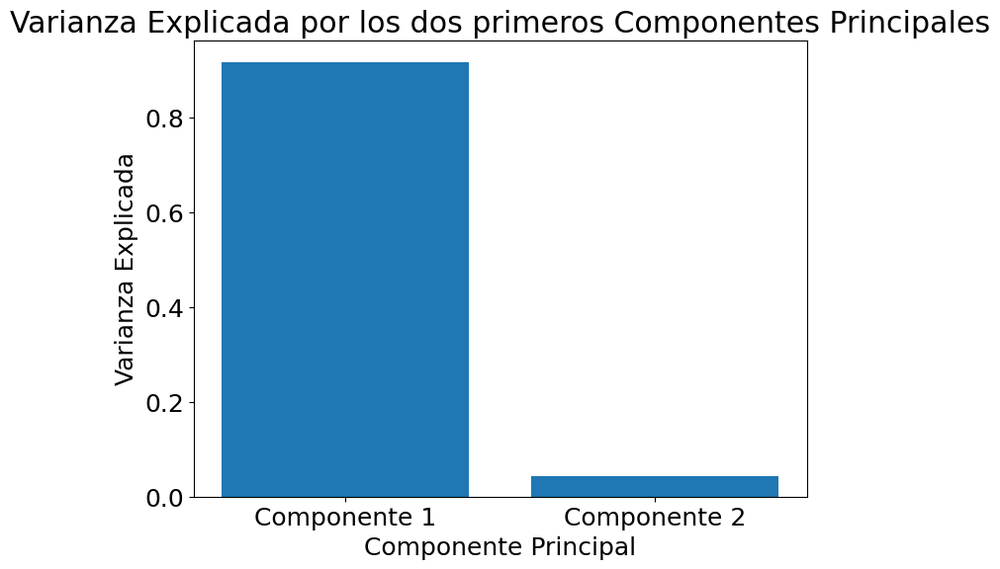

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

import pandas as pd
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Supongamos que VICTIMAS3 contiene tus datos
# Asegúrate de haber procesado y preprocesado tus datos adecuadamente antes de aplicar PCA

# Filtrar solo las columnas numéricas
columnas_numericas = VICTIMAS3.select_dtypes(include=['int64', 'float64']).columns
X = VICTIMAS3[columnas_numericas]

# Reemplazar los valores NaN por 0
X = X.fillna(0)

# Crear una instancia de PCA con 2 componentes principales
pca = PCA(n_components=2)

# Aplicar PCA a tus datos
pca_resultados = pca.fit_transform(X)

# Obtener los loadings de los dos primeros componentes principales
loadings = pca.components_[:2]

# Crear un DataFrame para mostrar los loadings
loadings_df = pd.DataFrame(loadings, columns=X.columns, index=['Componente 1', 'Componente 2'])

# Mostrar los loadings
print("Loadings de los dos primeros componentes principales:")
print(loadings_df)

# Graficar la varianza explicada por los componentes principales
plt.figure(figsize=(8, 6))
plt.bar(range(1, 3), pca.explained_variance_ratio_)
plt.xticks(range(1, 3), ['Componente 1', 'Componente 2'])
plt.xlabel('Componente Principal')
plt.ylabel('Varianza Explicada')
plt.title('Varianza Explicada por los dos primeros Componentes Principales')
plt.show()




In [ ]:
!pip install pca

In [ ]:
from pca import pca
from sklearn.preprocessing import StandardScaler


# Excluir la columna 'idFormulario' si está presente
if 'idFormulario' in df.columns:
    df = df.drop(columns=['idFormulario'])

# Filtrar solo las columnas numéricas
columnas_numericas = VICTIMAS3.select_dtypes(include=['int64', 'float64']).columns
X2 = VICTIMAS3[columnas_numericas]

# Reemplazar los valores NaN por 0
X2 = X2.fillna(0)

# Estandarizar tus datos
scaler = StandardScaler()
X2 = scaler.fit_transform(X2)

# Inicializamos el objeto PCA
model = pca(n_components=3)

# Ajustamos el PCA a nuestros datos
modelo = model.fit_transform(X2, verbose=False)
modelo


{'loadings':             1         2         3         4         5         6         7  \
 PC1  0.220208  0.016344  0.122950  0.206406  0.577994  0.092657  0.072902   
 PC2  0.304258  0.003878 -0.455449 -0.557555  0.059547 -0.001862  0.048387   
 PC3  0.190531 -0.014628  0.408945  0.319567  0.097766 -0.040027  0.090209   
 
             8         9        10        11        12        13        14  \
 PC1  0.041576  0.061170  0.242514 -0.038117 -0.555015 -0.105727  0.124766   
 PC2 -0.054138 -0.053168  0.187829 -0.433641 -0.082801  0.330098  0.096299   
 PC3 -0.018174 -0.050039 -0.187938 -0.189568 -0.113415  0.543721 -0.057684   
 
            15        16        17        18        19  
 PC1  0.138115 -0.007842 -0.286880 -0.017927 -0.207996  
 PC2  0.100775 -0.004107  0.126907 -0.033372 -0.040648  
 PC3 -0.008154 -0.027267  0.525793 -0.020349  0.105976  ,
 'PC':            PC1       PC2       PC3
 0    -1.465161  0.560670  0.479718
 1     1.211594  0.829670  0.716623
 2     0.992237  

[scatterd] >INFO> Create scatterplot


[pca] >Plot PC1 vs PC2 with loadings.


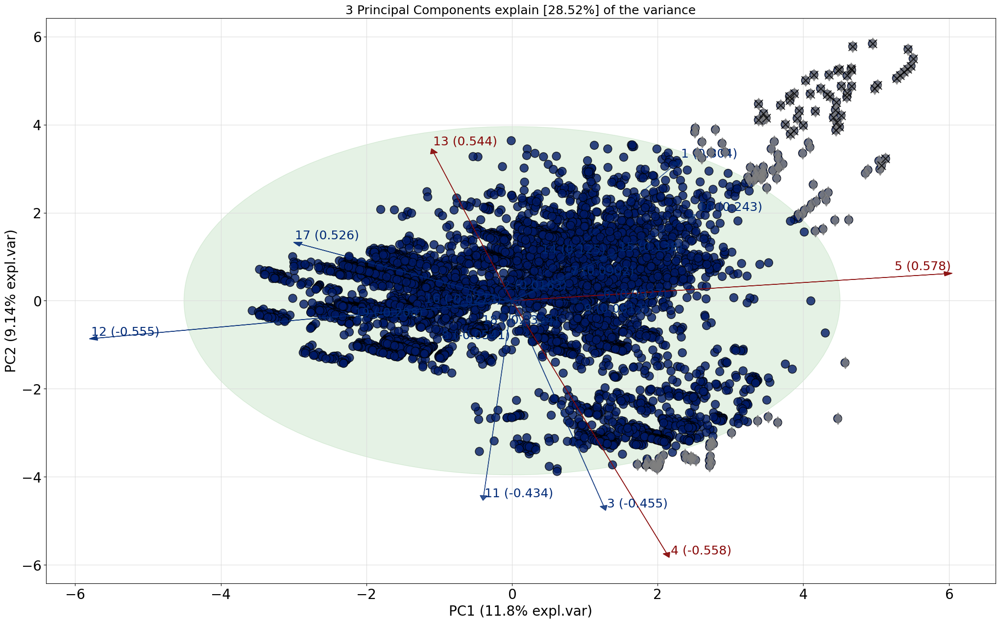

In [ ]:
# Creamos el biplot
fig, ax = model.biplot(SPE=True, HT2=True, legend=1)

In [ ]:
#ver los pesos o loadings
loadings_df

,Numero,LLevaCinturon,LlevaChaleco,LLevaCasco,CodigoVehiculo,CON_BICICLETA,CON_CARGA,CON_EMBRIAGUEZ,CON_HUECOS,CON_MENORES,CON_MOTO,CON_PEATON,CON_PERSONA_MAYOR,CON_RUTAS,CON_TPI,CON_VELOCIDAD,EDAD_PROCESADA2,MES_PROCESADO2,GRAVEDAD_PROCESADA2
Componente 1,-0.005840,-0.000110,-0.000236,-0.001560,-0.007189,-0.001236,-0.000067,-0.000199,-0.000086,-0.011472,-0.003199,0.007084,0.017753,-0.000532,-0.001712,-0.000403,0.999695,0.001346,0.002895
Componente 2,0.995589,-0.006805,-0.000619,-0.004271,0.044639,-0.004428,-0.000281,-0.000693,-0.000686,0.044049,-0.034471,-0.039123,0.043912,0.001163,-0.007163,-0.000166,0.006023,0.001025,-0.006829


[scatterd] >INFO> Create scatterplot
[scatterd] >INFO> Add density layer
[scatterd] >INFO> Create scatterplot
[scatterd] >INFO> Create scatterplot
[scatterd] >INFO> Add density layer
[scatterd] >INFO> Create scatterplot
[scatterd] >INFO> Add density layer
[scatterd] >INFO> Create scatterplot
[scatterd] >INFO> Create scatterplot


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '3 Principal Components explain [28.52%] of the variance'}, xlabel='PC1 (11.8% expl.var)', ylabel='PC3 (7.50% expl.var)'>)

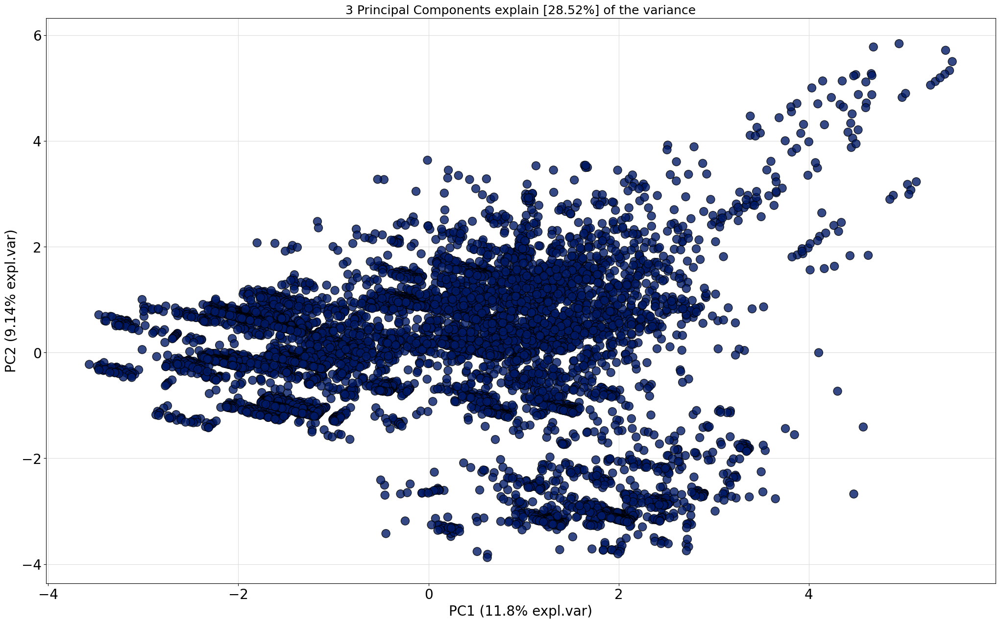

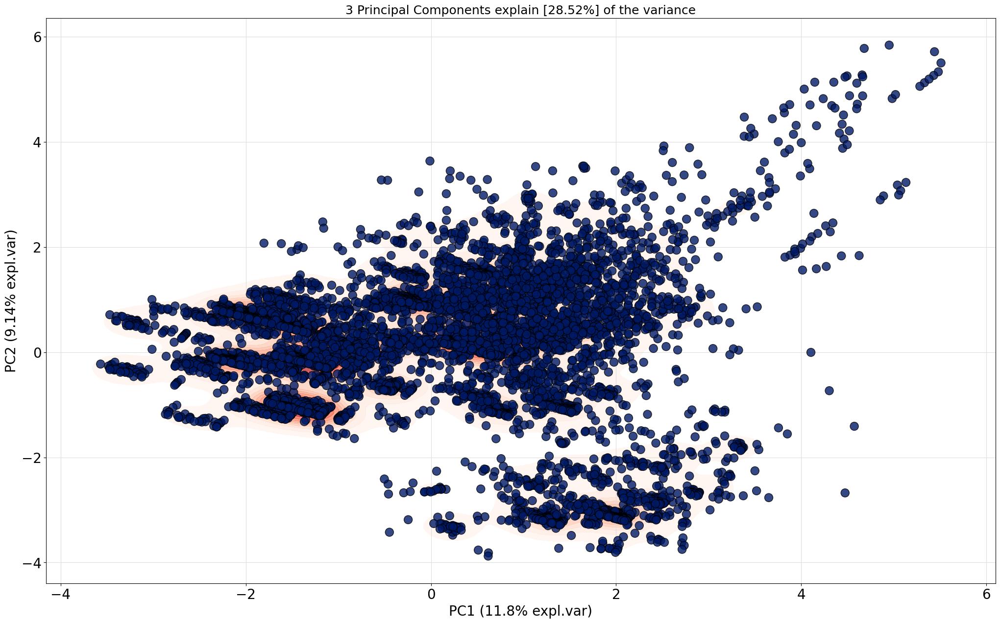

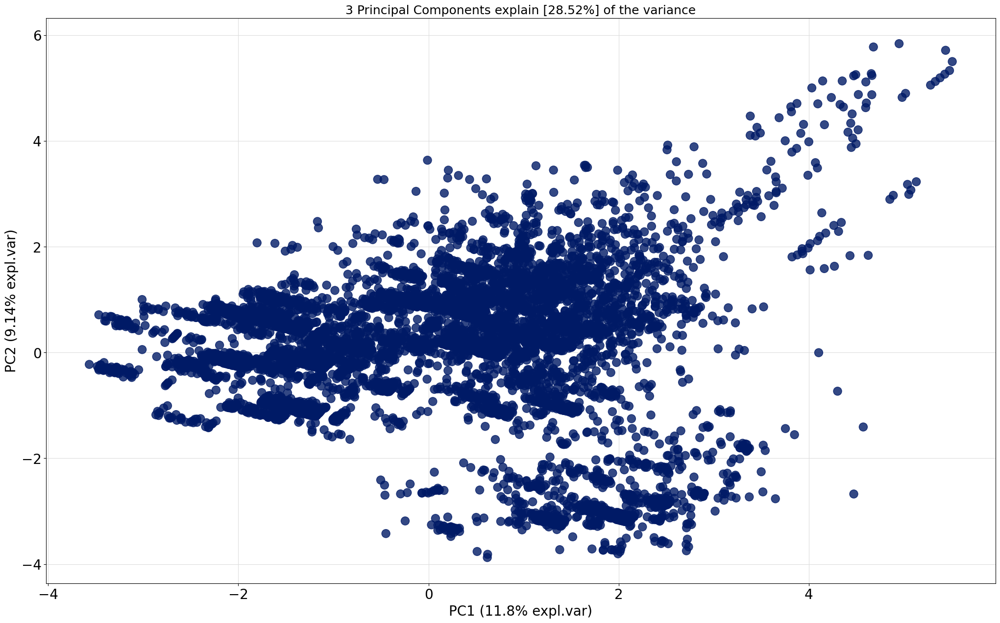

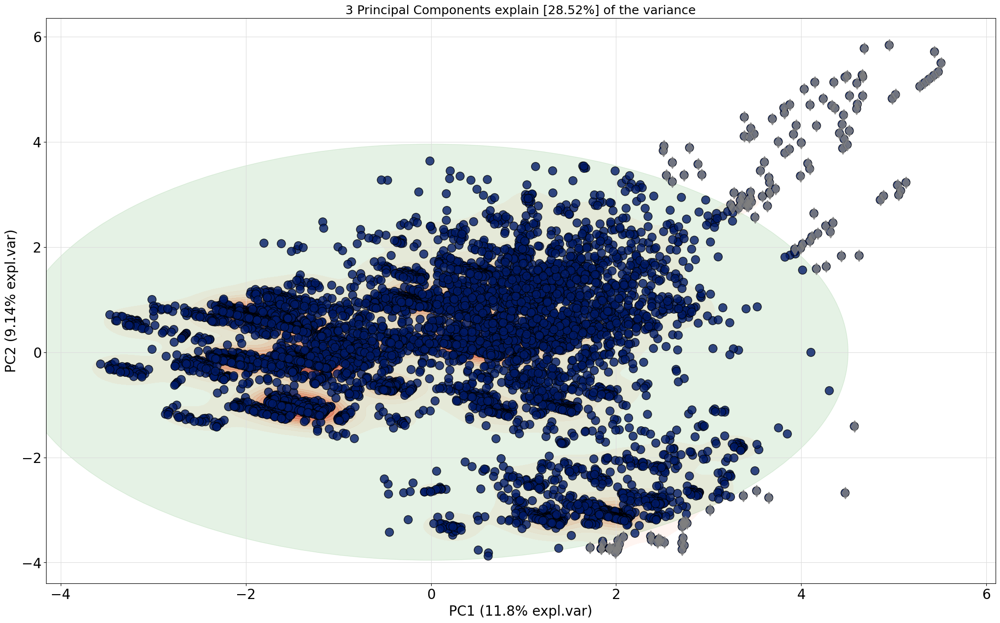

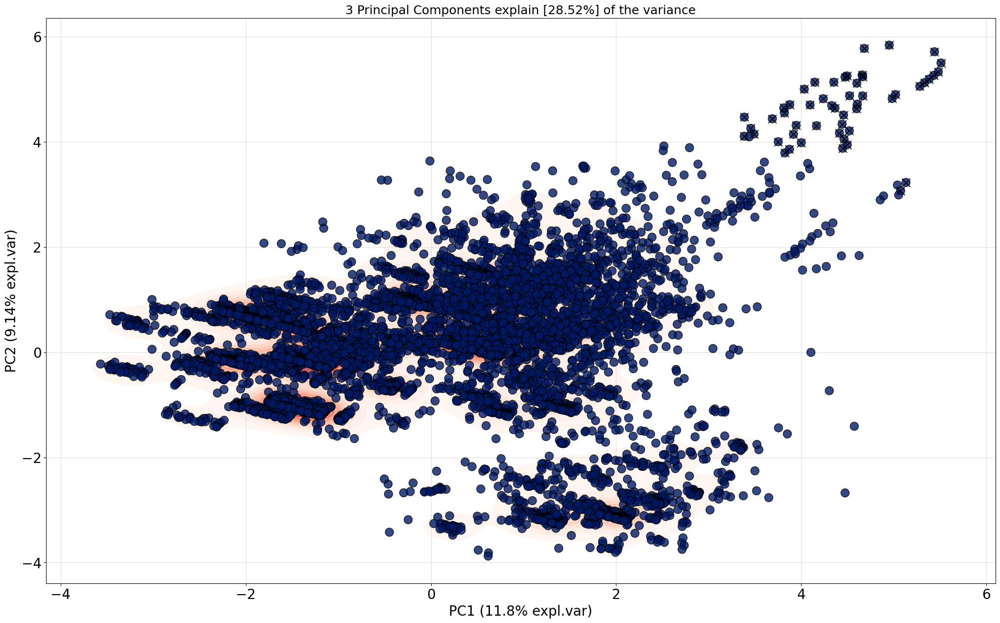

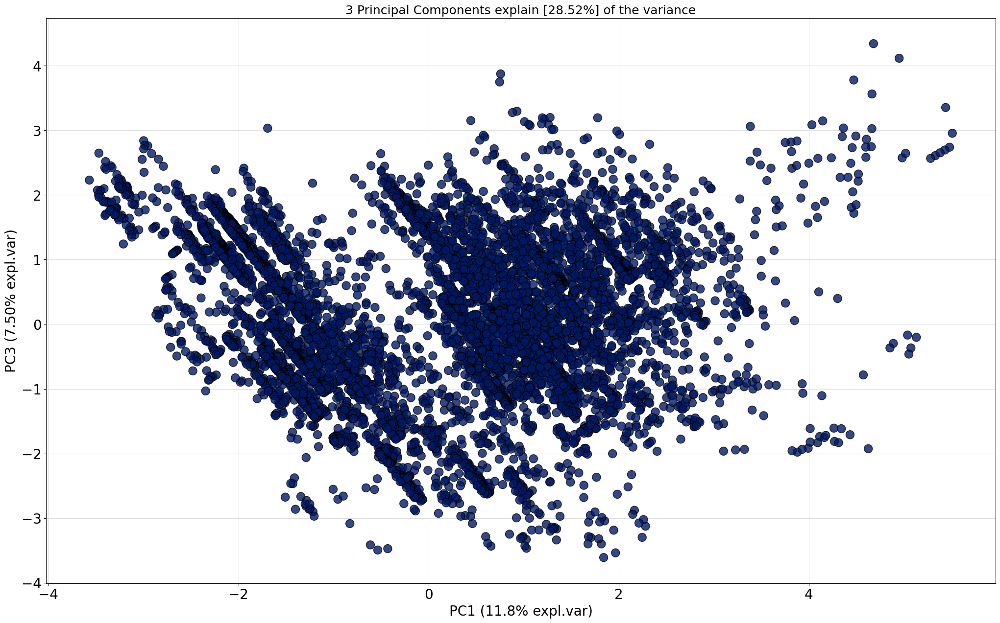

In [ ]:
# Make scatterplot
model.scatter()

# Make scatterplot
model.scatter(density=True)

# Gradient over the samples. High dense areas will be more colourful.
model.scatter(gradient='#FFFFFF', edgecolor=None)

# Include the outlier detection
model.scatter(SPE=True, density=True)

# Include the outlier detection
model.scatter(HT2=True, density=True)

# Look at different PCs: 1st PC=1  vs PC=3
model.scatter(PC=[0, 2])

In [ ]:
# Sumar las columnas que comienzan con "Lleva" y crear una nueva columna "Suma_Lleva"
VICTIMAS3['Suma_Lleva'] = VICTIMAS3.filter(like='Lleva').sum(axis=1)

# Sumar las columnas que comienzan con "CON" y crear una nueva columna "Suma_CON"
VICTIMAS3['Suma_CON'] = VICTIMAS23.filter(like='CON').sum(axis=1)

# Calcular la media por sexo
media_por_sexo = VICTIMAS2.groupby('Sexo')[['Suma_Lleva', 'Suma_CON']].mean()

# Mostrar la media por sexo
print(media_por_sexo)

In [290]:
pip install pandas_profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.3/357.3 kB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 9.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 21.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 25.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 27.8 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=d24887ac597f3d764450ab7d8f101d1374e6c00a431f91a4a79252be21725522
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: pydantic
    Found existing installation: pydantic 2.2.1
    Uninstalling pydantic-2.

In [291]:
from pandas_profiling import ProfileReport

profile = ProfileReport(VICTIMAS3)


# To save the report as an HTML file

#profile.to_file("data_profile_report.html")



# To display the report in a Jupyter Notebook

profile.to_notebook_iframe()

<ipython-input-291-00a911c98bdb>:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [293]:
profile = ProfileReport(VICTIMAS)

profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]